# Neches Meshing

In [244]:
import ipympl
%matplotlib ipympl

In [245]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [246]:
## Importing all the package needed to run the watershed workflow
# conda package imports ()
# Use the branch "master" git checkout master
import os,sys
import numpy as np
import pandas
import geopandas as gpd
from matplotlib import pyplot as plt
import logging
import pandas as pd
import copy
import scipy
import shapely
import pickle
import datetime
import h5py

import watershed_workflow 
import watershed_workflow.source_list
import watershed_workflow.ui
import watershed_workflow.utils
import watershed_workflow.plot
import watershed_workflow.mesh
import watershed_workflow.regions
import watershed_workflow.densification
import watershed_workflow.condition
watershed_workflow.ui.setup_logging(1,None)
import plot_wrm # $ATS_SRC_DIR/tools/utils
import watershed_workflow.land_cover_properties

# # # ats_input_spec library, to be moved to amanzi_xml (install package from repo "python setup.py install")
# # add "path"/ats_input_spec to PYTHONPATH
# Set the path to the amanzi source directory
# import ats_input_spec as ais
# ais.set_amanzi_source('/Users/gpq/ORNL/Projects/SETx_Urban/ATS_Implementation/ATS_Base/repos/amanzi')
import ats_input_spec
import ats_input_spec.public
import ats_input_spec.io



# # # amanzi_xml, included in AMANZI_SRC_DIR/tools/amanzi_xml  
# install it using: python setup.py install
import amanzi_xml.utils.io as aio
import amanzi_xml.utils.search as asearch
import amanzi_xml.utils.errors as aerrors


from shapely.geometry import Polygon, LineString
from shapely.ops import split

In [247]:
# Set working directory on the script folder    
os.chdir('/Users/gpq/ORNL/Projects/ATS_runs/setx_campaigns/setx-neches/scripts')

In [248]:
# Parameters cell -- this provides all parameters that can be changed via pipelining to generate a new watershed.
name = 'neches' # name the domain, used in filenames, etc

# geometric parameters
simplify = 100 # length scale to target average edge
simplify_rivers = 100
stream_outlet_width = 500 # half-width to track a labeled set on which to get discharge
ignore_small_rivers = 2 # ignore rivers which have this or fewer reaches.  likely they are irrigation ditches
                        # or other small features which make things complicated but likely don't add much value
prune_by_area_fraction = 0.001 # ignore reaches whose accumulated catchment area is less than this fraction of the
                              # full domain's area
prune_by_area_fraction_waterbodies = 0.00005#0.001
num_smoothing_sweeps = 5 # number of times to smooth the DEM prior to elevating

# simulation control
start_year = 1980  # year to start and end simulation simulation -- note these start and end Oct 1 of the year
end_year = 2020
min_porosity = 0.05 # minimum porosity considered too small
max_permeability = 1.e-10 # max value allowed for permeability
max_vg_alpha = 1.e-3 # max value of van Genuchten's alpha -- our correlation is not valid for some soils

# triangle refinement control
include_rivers = True
refine_d0 = 100
refine_d1 = 500
refine_A0 = 8000
refine_A1 = 50000


# soil structure.
use_geologic_layer = True
SOILconfig = 2 # The subsurface layering is defined from SSURGO (top to bedrock), and SSD (set the depth to bedrock). Nodata values from SSURGO is filled with GLHYMPS. See workflow_viillage for more options

# logistics
generate_plots = True # plots take time to make and aren't always needed
generate_daymet = True # potentially don't do Met data forcing
generate_modis = True

include_heterogeneous = True
include_homogeneous = False # if true, also write files for homogeneous runs
include_homogeneous_wrm = False # if true, also write files for homogeneous WRMs
include_homogeneous_wrm_porosity = False # if true, also write files for homogeneous porosity and WRMs
include_homogeneous_wrm_permeability = False # if true, also write files for homogeneous perm and WRMs

log_to_file = False  # if true, write to file instead of in the notebook output
figsize = (6,6)
figsize_3d = (8,6)

In [249]:
# parameter checking
assert(simplify > 0 and simplify < 300)
assert(ignore_small_rivers == None or (ignore_small_rivers >= 0 and ignore_small_rivers <= 100))
assert(prune_by_area_fraction == None or (prune_by_area_fraction >= 0 and prune_by_area_fraction < 1))
assert(start_year >= 1980 and start_year < 2020)

if prune_by_area_fraction_waterbodies is None:
    prune_by_area_fraction_waterbodies = prune_by_area_fraction * 0.1

In [250]:
# a dictionary of outputs -- will include all filenames generated
outputs = {}

In [251]:
# Note that, by default, we tend to work in the DayMet CRS because this allows us to avoid
# reprojecting meteorological forcing datasets.
crs = watershed_workflow.crs.daymet_crs()

## Sources and setup

Next we set up the source watershed and coordinate system and all data sources for our mesh.  We will use the CRS that is included in the shapefile.

In [252]:
logging.info("")
logging.info("="*30)


2024-04-04 15:24:30,269 - root - INFO: 
2024-04-04 15:24:30,270 - root - INFO: ==============================


A wide range of data sources are available; here we use the defaults except for using NHD Plus for watershed boundaries and hydrography (the default is NHD, which is lower resolution and therefore smaller download sizes).

In [253]:
# set up a dictionary of source objects
sources = watershed_workflow.source_list.get_default_sources()
sources['hydrography'] = watershed_workflow.source_list.hydrography_sources['NHD Plus']
sources['HUC'] = watershed_workflow.source_list.huc_sources['NHD Plus']
sources['DEM'] = watershed_workflow.source_list.dem_sources['NED 1/3 arc-second']
watershed_workflow.source_list.log_sources(sources)

2024-04-04 15:24:30,324 - root - INFO: Using sources:
2024-04-04 15:24:30,325 - root - INFO: --------------
2024-04-04 15:24:30,326 - root - INFO: HUC: National Hydrography Dataset Plus High Resolution (NHDPlus HR)
2024-04-04 15:24:30,326 - root - INFO: hydrography: National Hydrography Dataset Plus High Resolution (NHDPlus HR)
2024-04-04 15:24:30,326 - root - INFO: DEM: National Elevation Dataset (NED)
2024-04-04 15:24:30,326 - root - INFO: soil structure: National Resources Conservation Service Soil Survey (NRCS Soils)
2024-04-04 15:24:30,327 - root - INFO: geologic structure: GLHYMPS version 2.0
2024-04-04 15:24:30,327 - root - INFO: land cover: National Land Cover Database (NLCD) Layer: NLCD_2019_Land_Cover_L48
2024-04-04 15:24:30,328 - root - INFO: lai: MODIS
2024-04-04 15:24:30,328 - root - INFO: soil thickness: None
2024-04-04 15:24:30,328 - root - INFO: meteorology: DayMet 1km


In [254]:
# # load the huc
# hucs_df_1202 = gpd.read_file('../data/nhd_mr_v2_huc1202.gpkg')
# hucs_df_1202 = hucs_df_1202.to_crs(crs)
# watershed_containing_basin_neches = hucs_df_1202.geometry[0]


# # load the huc
# hucs_df_1204 = gpd.read_file('../data/nhd_mr_v2_huc1204.gpkg')
# hucs_df_1204 = hucs_df_1204.to_crs(crs)
# watershed_containing_basin_gv= hucs_df_1204.geometry[0]

### Loading V2 Datasets and Defining Overall Domain

Composing the domian for Neches River Basin and Eastern Galvastan Bay

In [255]:
# full neches
# load hucs with judiciosu boundary selection
_, ws_full_neches = watershed_workflow.get_hucs(sources['HUC'], '1202', 4, crs)

_, ws_village = watershed_workflow.get_hucs(sources['HUC'], '12020006', 8, crs)

_, ws_pine_island_bayou = watershed_workflow.get_hucs(sources['HUC'], '12020007', 8, crs)

_, ws_ten_mile_creek_neches = watershed_workflow.get_hucs(sources['HUC'], '1202000304', 10, crs)

_, ws_east_galvastan_bay = watershed_workflow.get_hucs(sources['HUC'], '12040202', 8, crs)

_, ws_sabine_lake = watershed_workflow.get_hucs(sources['HUC'], '12040201', 8, crs)


_, ws_old_river= watershed_workflow.get_hucs(sources['HUC'], '120402010500', 12, crs)

_, ws_south_canal= watershed_workflow.get_hucs(sources['HUC'], '120402010400', 12, crs)


2024-04-04 15:24:30,422 - root - INFO: 
2024-04-04 15:24:30,423 - root - INFO: Loading level 4 HUCs in 1202
2024-04-04 15:24:30,423 - root - INFO: ------------------------------
2024-04-04 15:24:30,427 - root - INFO: Using HUC file "/Users/gpq/ORNL/Projects/ATS_runs/global_data/hydrography/NHDPlus_H_1202_GDB/NHDPlus_H_1202.gdb"
2024-04-04 15:24:31,751 - root - INFO: ... found 1 HUCs
2024-04-04 15:24:31,751 - root - INFO:   -- 1202
2024-04-04 15:24:31,754 - root - INFO: Converting to out_crs
2024-04-04 15:24:31,778 - root - INFO: Converting to shapely
2024-04-04 15:24:31,795 - root - INFO:  ... done
2024-04-04 15:24:31,797 - root - INFO: 
2024-04-04 15:24:31,798 - root - INFO: Loading level 8 HUCs in 12020006
2024-04-04 15:24:31,798 - root - INFO: ------------------------------
2024-04-04 15:24:31,798 - root - INFO: Using HUC file "/Users/gpq/ORNL/Projects/ATS_runs/global_data/hydrography/NHDPlus_H_1202_GDB/NHDPlus_H_1202.gdb"
2024-04-04 15:24:31,823 - root - INFO: ... found 1 HUCs
2024

In [256]:
# load the huc
ws_sabine_lake_cropped = [ws_sabine_lake[0].difference(shapely.ops.unary_union(ws_old_river+ws_south_canal))]
from shapely.ops import unary_union
my_hucs = [unary_union(ws_full_neches +ws_east_galvastan_bay+ws_sabine_lake_cropped)]

watershed_containing_basin = shapely.ops.unary_union(my_hucs)

In [257]:
# # save watershed_containing_basin as a shapefile, this is in shapely format
# gdf_basin = gpd.GeoDataFrame(geometry=[watershed_containing_basin], crs=crs) 
# gdf_basin.to_file('../data-processed/basin/complete_watershed_domain.shp')

In [258]:
version = '_v21'

In [259]:
def fixNames(df):
    df['HydrologicSequence'] = df.pop('hydroseq')
    df['DownstreamMainPathHydroSeq'] = df.pop('dnhydroseq')
    df['AreaSqKm'] = df.pop('areasqkm')
    df['TotalDrainageAreaSqKm'] = df.pop('totdasqkm')
    df['DivergenceRoutedDrainAreaSqKm'] = df.pop('divdasqkm')
    df['UpstreamMainPathHydroSeq'] = df.pop('uphydroseq')
    df['DivergenceCode'] = df.pop('divergence')


# find the corresponding reaches
def find_reaches(rivers, ids):
    reaches = []
    for nhdid in ids:
        found = False
        for river in rivers:
            n = river.getNode(nhdid)
            if n is not None:
                found = True
                reaches.append(n)
                break
        if not found:
            reaches.append(None)
    return reaches


In [260]:
# download/collect the river network within that shape's bounds
flowlines_df_1202 = gpd.read_file(f'../data/nhd_mr_v2_huc1202_flowlines{version}.gpkg')
flowlines_df_1202 = flowlines_df_1202.explode()
flowlines_df_1202 = flowlines_df_1202.to_crs(crs)

flowlines_df_1204 = gpd.read_file(f'../data/nhd_mr_v2_huc1204_flowlines{version}.gpkg')
flowlines_df_1204 = flowlines_df_1204.explode()
flowlines_df_1204 = flowlines_df_1204.to_crs(crs)

flowlines_df = flowlines_df_1202.append(flowlines_df_1204)

fixNames(flowlines_df)
flowlines_df['HydrologicSequence'] = flowlines_df['HydrologicSequence'].astype(int)
flowlines_df['DownstreamMainPathHydroSeq'] = flowlines_df['DownstreamMainPathHydroSeq'].astype(int)

In [261]:
cas_df_1202 = gpd.read_file(f'../data/nhd_mr_v2_huc1202_catchments{version}.gpkg')
cas_df_1204 = gpd.read_file(f'../data/nhd_mr_v2_huc1204_catchments{version}.gpkg')
cas_df = cas_df_1202.append(cas_df_1204)
cas_df = cas_df_1202.to_crs(crs)
cas_df['catchment'] = cas_df.pop('geometry')

In [262]:
# merge the two -- not all flowlines have cas?
flowlines_df = pd.merge(flowlines_df, cas_df, how='outer', left_on='comid', right_on='comid', suffixes=(None, '_ca'))
flowlines_df['ID'] = flowlines_df['comid']

In [263]:
# now convert to ww form
reaches_raw = [shapely.wkb.loads(shapely.wkb.dumps(geom, output_dimension=2)) for geom in flowlines_df.geometry]
flowlines_df_noflowlines = flowlines_df.drop(columns=['geometry',])
for i, fl in enumerate(reaches_raw):
    fl.properties = dict(flowlines_df_noflowlines.iloc[i])

print(len(reaches_raw))

9642


In [264]:
# and construct the rivers
reaches_raw = [reach for reach in reaches_raw if reach.intersects(watershed_containing_basin)]
rivers_raw = watershed_workflow.construct_rivers(reaches_raw, method='hydroseq')
print(len(rivers_raw))

2024-04-04 15:25:00,781 - root - INFO: 
2024-04-04 15:25:00,781 - root - INFO: Constructing river network
2024-04-04 15:25:00,782 - root - INFO: ------------------------------
2024-04-04 15:25:00,782 - root - INFO: Generating the river tree
2024-04-04 15:25:01,376 - root - INFO:  ... generated 7 rivers


7


In [265]:
def getNode(nhd_id , rivers):
    node = next(river.getNode(nhd_id) for river in rivers if river.getNode(nhd_id) != None)
    return node

def get_subDomain(id, subdomains):
    subdomain_index = next((index, subdomain) for index, subdomain in enumerate(subdomains) if subdomain.properties['outlet_ID'] == id)
    index, subdomain = subdomain_index
    return index, subdomain

## Subdomain generation

### Get river network

This will download the river network from the NHD Plus database, and simplify the network, constructing a tree-like data structure.

In [266]:
# # what about the reservoir!
# _, waterbodies_1202 = watershed_workflow.get_waterbodies(sources['hydrography'], '1202',  out_crs=crs, 
#                                                     prune_by_area=prune_by_area_fraction_waterbodies*watershed_containing_basin = shapely.ops.unary_union(my_hucs).exterior().area)

# _, waterbodies_1204 = watershed_workflow.get_waterbodies(sources['hydrography'], '1204', out_crs=crs,
#     prune_by_area=prune_by_area_fraction_waterbodies*watershed_containing_basin = shapely.ops.unary_union(my_hucs).exterior().area)

# waterbodies = waterbodies_1202 + waterbodies_1204

In [267]:
# now that we are done modifying, we must compute our own contributing areas on this new network
for river in rivers_raw:
    river.accumulate('AreaSqKm', to_save='ContributingAreaSqKm')

# reset the reaches raw, now that we are done manipulating
reaches_raw = [r for river in rivers_raw for r in river]

In [268]:
# make a copy of the rivers_raw and compute pruned rivers
rivers = [r.deepcopy() for r in rivers_raw]

rivers = watershed_workflow.reduce_rivers(rivers,
                                          ignore_small_rivers=ignore_small_rivers,
                                          prune_by_area=(50),
                                          area_property='ContributingAreaSqKm',
                                          remove_diversions=True,
                                          remove_braided_divergences=True)


for i, river in enumerate(rivers):
   print(i, len(river))

2024-04-04 15:25:07,635 - root - INFO: Removing rivers with fewer than 2 reaches.
2024-04-04 15:25:07,683 - root - INFO: ... removed 2 rivers
2024-04-04 15:25:07,683 - root - INFO: Removing rivers with area < 50
2024-04-04 15:25:07,684 - root - INFO: Removing divergent sections...
2024-04-04 15:25:08,179 - root - INFO:   ... removed 176 divergence tributaries with 307 total reaches.
2024-04-04 15:25:08,180 - root - INFO:   ... removed 3 divergence tributaries with 8 total reaches.
2024-04-04 15:25:08,191 - root - INFO:   ... removed 44 divergence tributaries with 84 total reaches.
2024-04-04 15:25:08,191 - root - INFO: Pruning by total contributing area < 50
2024-04-04 15:25:09,792 - root - INFO: ... pruned 4072
2024-04-04 15:25:09,792 - root - INFO: Removing rivers with fewer than 2 reaches.
2024-04-04 15:25:09,802 - root - INFO: ... removed 0 rivers


0 1457
1 21
2 262


In [269]:
## CUSTOM
## Both GV and main Neches tree are currently joined into main tree near the outlet, however they are connected through a canal that runs along the coast. 
## We separate them into two trees, both pouring out into the ocea at different locations

outlet_ids = ['1524219', '1115825']
# rivers_raw  = find_reaches(rivers_raw, outlet_ids)
rivers  = find_reaches(rivers, outlet_ids)



In [270]:
rivers_raw = list(sorted(rivers_raw, key=lambda a : -len(a)))
rivers = list(sorted(rivers, key=lambda a : -len(a)))


/Users/gpq/anaconda3/envs/watershed_workflow-master-2023-04-11/lib/python3.10/site-packages/pyproj/crs/crs.py:1282: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


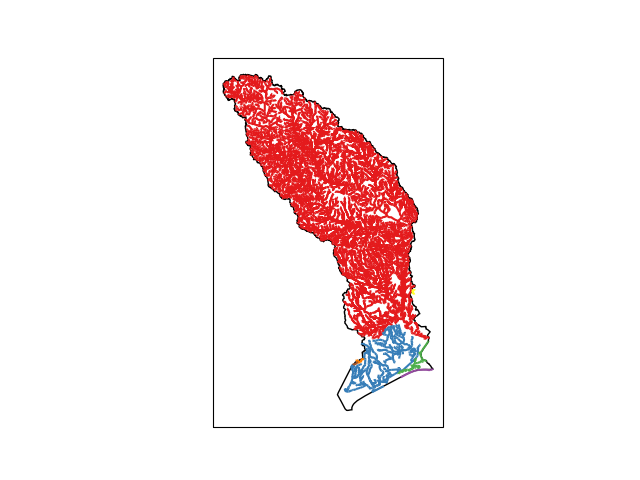

In [271]:
# what do these rivers look like?
fig, ax = watershed_workflow.plot.get_ax(crs)
watershed_workflow.plot.shplys([watershed_containing_basin,], crs, 'k', ax)

river_colors = watershed_workflow.colors.enumerated_colors(len(rivers_raw))
for i, river in enumerate(rivers_raw):
    watershed_workflow.plot.rivers([river,], crs, river_colors[i], ax)



In [272]:
watershed_containing_basin.area/1e6/6

4763.970823008724

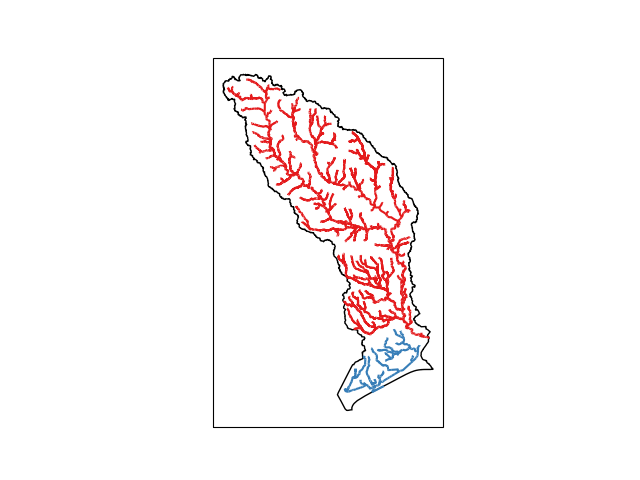

In [273]:
# and the simplified form
fig, ax = watershed_workflow.plot.get_ax(crs)
watershed_workflow.plot.shplys([watershed_containing_basin,], crs, 'k', ax)

river_colors = watershed_workflow.colors.enumerated_colors(len(rivers))
for i, river in enumerate(rivers):
    watershed_workflow.plot.rivers([river,], crs, river_colors[i], ax)


In [274]:
# shapefile_gages= '/Users/7s2/Research/projects/setx/SETx/data/gis/gagesII_9322_point_shapefile/gagesII_9322_sept30_2011.shp'
shapefile_gages= '/Users/gpq/ORNL/Databases/Gauges/gagesII_9322_point_shapefile/gagesII_9322_sept30_2011.shp'
gages = gpd.read_file(shapefile_gages)
gages = gages.to_crs(crs)
neches_gages = [point for point in gages.geometry if watershed_containing_basin.contains(point)]

for neches_gage in neches_gages: 
    gage = gages.loc[gages['geometry'].within(neches_gage)]

    gage_property_names = gages.columns.to_list()[:-1]
    gage_properties = gage.drop(['geometry'], axis=1)
    prop_dict = {name: value for name, value in zip(gage_property_names, gage_properties.values[0])}
    neches_gage.properties = prop_dict


2024-04-04 15:25:11,473 - fiona.ogrext - INFO: Failed to auto identify EPSG: 7


/Users/gpq/anaconda3/envs/watershed_workflow-master-2023-04-11/lib/python3.10/site-packages/pyproj/crs/crs.py:1282: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


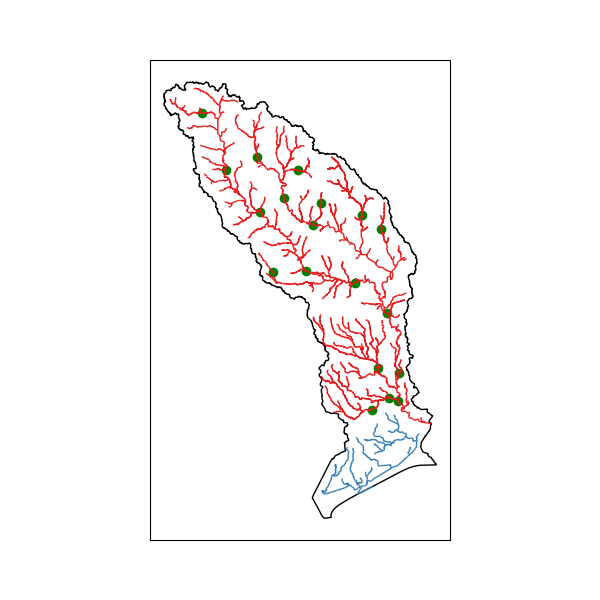

In [275]:
# and the simplified form
fig = plt.figure(figsize=figsize)
ax = watershed_workflow.plot.get_ax(crs, fig, window=[0.05,0.1,0.9,0.8])    
watershed_workflow.plot.shplys(my_hucs, crs, 'k', ax)
# watershed_workflow.plot.shplys(waterbodies, crs, 'g', ax, facecolor='c')
watershed_workflow.plot.shplys(neches_gages, crs, 'g', ax)

river_colors = watershed_workflow.colors.enumerated_colors(len(rivers_raw))
for i, river in enumerate(rivers):
    watershed_workflow.plot.rivers([river,], crs, river_colors[i], ax, linewidth= 1)



In [276]:
# the initial NHDPlusID of the full domain
gage_data = gpd.read_file(f'../data/neches_site_descriptions{version}.gpkg')
gage_data = gage_data.to_crs(crs)

gage_flowlines = pd.DataFrame({'comid':flowlines_df.comid,
                                   'flowline':flowlines_df.geometry})

gage_data = pd.merge(gage_data, gage_flowlines, how='left', left_on='comid', right_on='comid')

excluded_gages = ['Pine Island Bayou abv BI Pump Plant, Beaumont, TX', 'Bayou Lanana at Nacogdoches, TX','Neches Rv at Evadale, TX']
gages_selected = gage_data[~gage_data['name'].isin(excluded_gages)]
gages_selected

,identifier,navigation,measure,reachcode,name,source,sourceName,comid,type,uri,mainstem,geometry,flowline
0,USGS-08031200,https://labs.waterdata.usgs.gov/api/nldi/linke...,9.879423,12020001000135,"Kickapoo Ck nr Brownsboro, TX",nwissite,NWIS Surface Water Sites,4451722,hydrolocation,https://waterdata.usgs.gov/monitoring-location...,https://geoconnex.us/ref/mainstems/2603210,POINT (401440.820 -1074785.461),"LINESTRING Z (400933.044 -1074807.973 0.000, 4..."
1,USGS-08032000,https://labs.waterdata.usgs.gov/api/nldi/linke...,88.308180,12020001000112,"Neches Rv nr Neches, TX",nwissite,NWIS Surface Water Sites,4452936,hydrolocation,https://waterdata.usgs.gov/monitoring-location...,https://geoconnex.us/ref/mainstems/2602412,POINT (419846.640 -1118787.001),"LINESTRING Z (419249.159 -1118498.733 0.000, 4..."
2,USGS-08032500,https://labs.waterdata.usgs.gov/api/nldi/linke...,94.895390,12020001023323,"Neches Rv nr Alto, TX",nwissite,NWIS Surface Water Sites,1077643,hydrolocation,https://waterdata.usgs.gov/monitoring-location...,https://geoconnex.us/ref/mainstems/2602412,POINT (446104.569 -1151095.359),"LINESTRING Z (445943.005 -1151029.501 0.000, 4..."
3,USGS-08033000,https://labs.waterdata.usgs.gov/api/nldi/linke...,14.809472,12020002000020,"Neches Rv nr Diboll, TX",nwissite,NWIS Surface Water Sites,1079041,hydrolocation,https://waterdata.usgs.gov/monitoring-location...,https://geoconnex.us/ref/mainstems/2602412,POINT (481919.680 -1197220.423),"LINESTRING Z (480833.649 -1196777.709 0.000, 4..."
4,USGS-08033300,https://labs.waterdata.usgs.gov/api/nldi/linke...,81.677606,12020002000166,"Piney Ck nr Groveton, TX",nwissite,NWIS Surface Water Sites,1080121,hydrolocation,https://waterdata.usgs.gov/monitoring-location...,https://geoconnex.us/ref/mainstems/2603096,POINT (456212.462 -1197968.011),"LINESTRING Z (455947.045 -1197238.510 0.000, 4..."
5,USGS-08033500,https://labs.waterdata.usgs.gov/api/nldi/linke...,68.708029,12020003000101,"Neches Rv nr Rockland, TX",nwissite,NWIS Surface Water Sites,1109655,hydrolocation,https://waterdata.usgs.gov/monitoring-location...,https://geoconnex.us/ref/mainstems/2602412,POINT (520762.405 -1206392.933),"LINESTRING Z (520518.508 -1206295.075 0.000, 5..."
6,USGS-08033900,https://labs.waterdata.usgs.gov/api/nldi/linke...,94.710962,12020004000076,"E Fk Angelina Rv nr Cushing, TX",nwissite,NWIS Surface Water Sites,1149925,hydrolocation,https://waterdata.usgs.gov/monitoring-location...,https://geoconnex.us/ref/mainstems/2603389,POINT (475816.717 -1118991.329),"LINESTRING Z (475917.333 -1118950.060 0.000, 4..."
7,USGS-08034500,https://labs.waterdata.usgs.gov/api/nldi/linke...,32.869861,12020004000180,"Mud Ck nr Jacksonville, TX",nwissite,NWIS Surface Water Sites,1151409,hydrolocation,https://waterdata.usgs.gov/monitoring-location...,https://geoconnex.us/ref/mainstems/2602992,POINT (444103.682 -1108335.159),"LINESTRING Z (443873.565 -1107491.400 0.000, 4..."
8,USGS-08036500,https://labs.waterdata.usgs.gov/api/nldi/linke...,25.782583,12020004000050,"Angelina Rv nr Alto, TX",nwissite,NWIS Surface Water Sites,1150499,hydrolocation,https://waterdata.usgs.gov/monitoring-location...,https://geoconnex.us/ref/mainstems/2602713,POINT (465161.144 -1139984.373),"LINESTRING Z (463944.450 -1137806.249 0.000, 4..."
9,USGS-08037000,https://labs.waterdata.usgs.gov/api/nldi/linke...,6.487554,12020004000715,"Angelina Rv nr Lufkin, TX",nwissite,NWIS Surface Water Sites,1152351,hydrolocation,https://waterdata.usgs.gov/monitoring-location...,https://geoconnex.us/ref/mainstems/2602713,POINT (487460.005 -1161777.749),"LINESTRING Z (486761.922 -1161012.718 0.000, 4..."


### Identify the major inlets/HUC12 spillpoints to the reservoir

In [277]:
# the initial NHDPlusID of the full domain
neches = rivers[0]
gv_bay = rivers[1]
outlet_ids = [neches.properties['ID'], gv_bay.properties['ID'] ]


# get the nhdids of the gage reaches
nhdids = list(gages_selected.comid) + outlet_ids
nhd_names = list(gages_selected.name)+['Neches River', 'GV Bay outlet']

for id, name in zip(nhdids, nhd_names):
    print(id, name)


4451722 Kickapoo Ck nr Brownsboro, TX
4452936 Neches Rv nr Neches, TX
1077643 Neches Rv nr Alto, TX
1079041 Neches Rv nr Diboll, TX
1080121 Piney Ck nr Groveton, TX
1109655 Neches Rv nr Rockland, TX
1149925 E Fk Angelina Rv nr Cushing, TX
1151409 Mud Ck nr Jacksonville, TX
1150499 Angelina Rv nr Alto, TX
1152351 Angelina Rv nr Lufkin, TX
1157813 Attoyac Bayou nr Chireno, TX
1159329 Ayish Bayou nr San Augustine, TX
1111453 Neches Rv nr Town Bluff, TX
1166409 Village Ck nr Kountze, TX
1143252 Pine Island Bayou nr Sour Lake, TX
1114345 Neches Rv Saltwater Barrier at Beaumont, TX
1115825 Neches River
1524219 GV Bay outlet


In [278]:
trunk_reaches = find_reaches(rivers_raw, nhdids)
assert(all(tr is not None for tr in trunk_reaches))

trunk_reaches_pruned = find_reaches(rivers, nhdids)
assert(all(tr is not None for tr in trunk_reaches))
print([i for (i,tr) in enumerate(trunk_reaches_pruned) if tr is None])


[]


/Users/gpq/anaconda3/envs/watershed_workflow-master-2023-04-11/lib/python3.10/site-packages/pyproj/crs/crs.py:1282: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


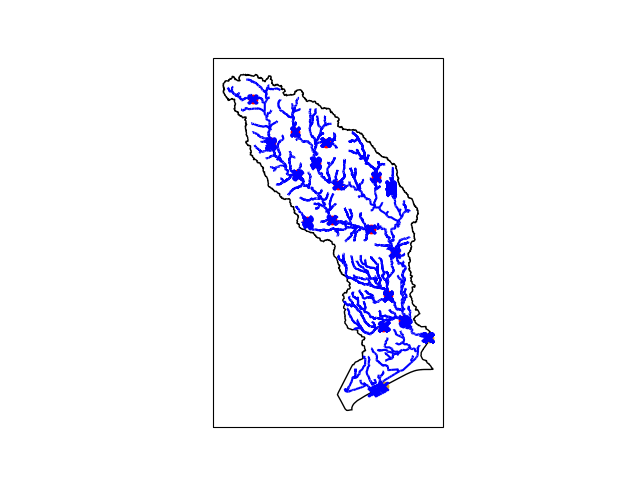

In [279]:
if generate_plots:
    fig, ax = watershed_workflow.plot.get_ax(crs)
    
    watershed_workflow.plot.shply(watershed_containing_basin , crs, 'k', ax)
    watershed_workflow.plot.rivers(rivers, crs,'b', ax)
    watershed_workflow.plot.shplys(gages_selected.geometry, crs, 'r', ax, label='gage locations')
    watershed_workflow.plot.shply(shapely.geometry.Point(neches.segment.coords[-1]), crs, 'goldenrod', ax)
    watershed_workflow.plot.shply(shapely.geometry.Point(gv_bay.segment.coords[-1]), crs, 'goldenrod', ax)

    gage_reaches = [tr.segment for tr in trunk_reaches_pruned]
    watershed_workflow.plot.shply(gage_reaches, crs, 'b', ax, marker='x')

### Partition the domain into nonoverlapping subdomains

In [280]:
# define domains that are the accumulated area of these trunk reaches
trunk_reaches, incremental_cas = watershed_workflow.river_tree.accumulateIncrementalCatchments(rivers_raw, nhdids, nhd_names)

# form a list of the rivers that are not used in trunk_reaches -- this will be used to fill the holes
rivers_not_touched = rivers_raw[:]
for tr_root in set([tr.getRoot() for tr in trunk_reaches]):
    rivers_not_touched.remove(tr_root)



In [281]:
# some contributing areas are discontinuous -- this is physically wrong, but what can you do?
incremental_cas2 = []
for poly in incremental_cas:
    if isinstance(poly, shapely.geometry.Polygon):
        incremental_cas2.append(poly)
    else:
        incremental_cas2.append(watershed_workflow.split_hucs.biggest(poly))
        incremental_cas2[-1].properties = poly.properties
incremental_cas = incremental_cas2


In [282]:
# sort the trunks by CA size -- this isn't needed but allows for nicer plots later
sorted_pairs = sorted(zip(trunk_reaches, incremental_cas), key=lambda a : a[0].properties['TotalDrainageAreaSqKm'], reverse=True)
trunk_reaches = [i[0] for i in sorted_pairs]
incremental_cas = [i[1] for i in sorted_pairs]

assert(all(hasattr(poly, 'properties') for poly in incremental_cas))
assert(all(isinstance(poly, shapely.geometry.Polygon) for poly in incremental_cas))



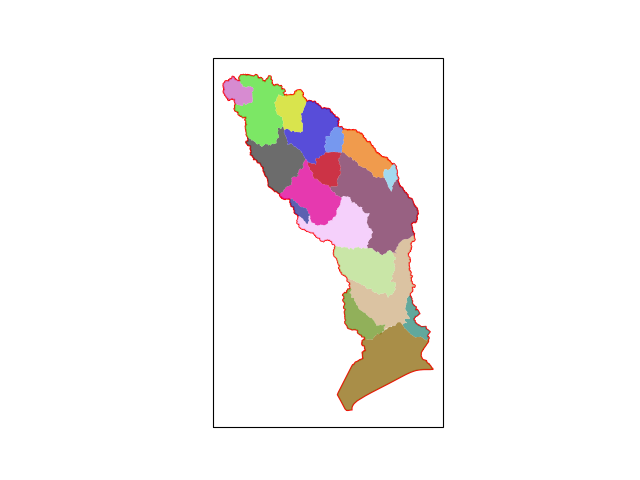

In [283]:
subdomains = watershed_workflow.utils.deepcopy(incremental_cas)


id, subdomain = get_subDomain('1524219', subdomains)
props = subdomain.properties
subdomain = shapely.ops.unary_union([subdomain]+ws_sabine_lake_cropped+ws_east_galvastan_bay)
subdomain.properties = props
subdomains[id] = subdomain


fig, ax = watershed_workflow.plot.get_ax(crs)
watershed_workflow.plot.shply(watershed_containing_basin, crs, 'r', ax)
watershed_workflow.plot.shplys(subdomains, crs, None, ax, facecolor='edge', alpha=0.8)

In [284]:
#### CUSTOM #### the small sliver hole was merge in domain far away when allowed to be merged automatically. We want to do it manually 

coastal_subdomain_exterior = shapely.geometry.Polygon(shapely.ops.unary_union([subdomains[0],subdomains[1], subdomains[17]]).exterior)
coastal_subdomains = shapely.ops.unary_union([subdomains[0], subdomains[1], subdomains[17]])

holes_in_between =  coastal_subdomain_exterior.difference(coastal_subdomains)
holes_sorted = list(sorted(holes_in_between, key=lambda p : p.area, reverse=True))
hole_of_concern = holes_sorted[2]

# merge it into GV suubdomain
props = subdomains[17].properties
subdomain_new = shapely.ops.unary_union([subdomains[17], hole_of_concern])
subdomain_new.properties = props

subdomains[17] = subdomain_new

2024-04-04 15:25:15,416 - root - INFO: Removing holes on 18 polygons
2024-04-04 15:25:15,417 - root - INFO:   -- removed interior
2024-04-04 15:25:15,498 - root - INFO:   -- union
2024-04-04 15:25:15,498 - root - INFO: Parsing 1 components for holes
2024-04-04 15:25:15,499 - root - INFO: Found a little hole: area = 16902.036006747978 at POINT (517935.0614000008 -1318142.9960888384)
2024-04-04 15:25:15,502 - root - INFO: Found a little hole: area = 41.360600031939704 at POINT (520641.1379467126 -1317940.2125813991)
2024-04-04 15:25:15,503 - root - INFO: Found a little hole: area = 0.6840415241926517 at POINT (521171.4270025867 -1318130.9096821018)
2024-04-04 15:25:15,506 - root - INFO: Found a little hole: area = 697.9428171135505 at POINT (521699.92896553606 -1318161.5915275435)
2024-04-04 15:25:15,507 - root - INFO: Found a little hole: area = 9337.702551242168 at POINT (522155.3370824584 -1318217.0111081724)
2024-04-04 15:25:15,508 - root - INFO: Found a little hole: area = 1078.5933

2


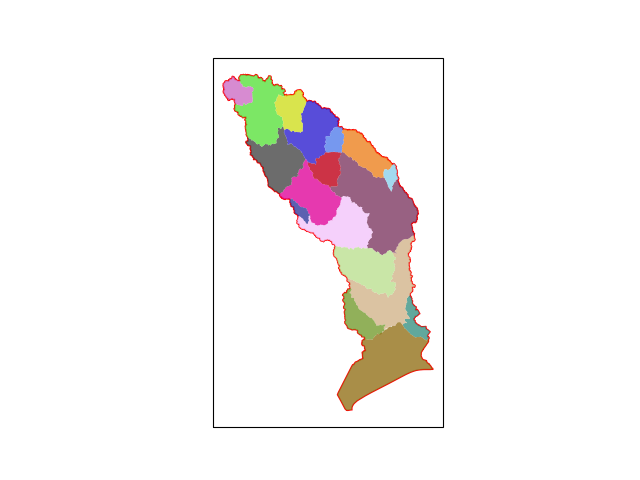

In [285]:
# automatically clean up holes on the interior or exterior boundary
subdomains, holes = watershed_workflow.split_hucs.removeHoles(subdomains)

print(len(holes))
fig, ax =  watershed_workflow.plot.get_ax(crs)
watershed_workflow.plot.shply(watershed_containing_basin, crs, 'r', ax)
watershed_workflow.plot.shplys(subdomains, crs, None, ax, facecolor='edge', alpha=0.8)


3167
1099
2
2


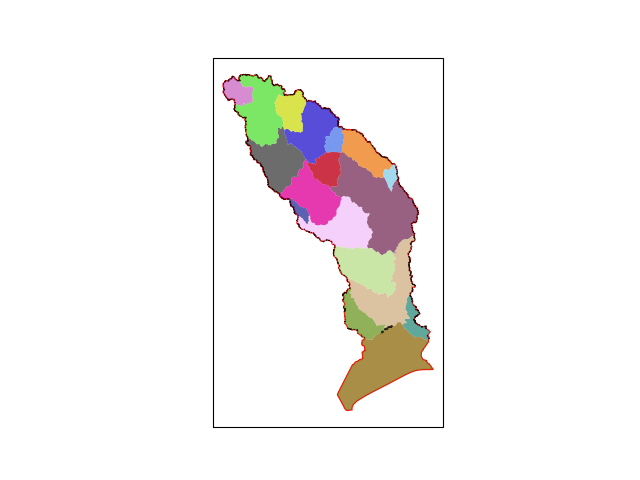

In [286]:
# get the missing areas
all_subdomains = shapely.ops.unary_union(subdomains)
missing_regions = watershed_containing_basin.difference(all_subdomains)
print(len(missing_regions))
missing_regions = [mr for mr in missing_regions if mr.area > 1000]
print(len(missing_regions))


fig, ax = watershed_workflow.plot.get_ax(crs)

watershed_workflow.plot.shply(watershed_containing_basin, crs, 'r', ax)
watershed_workflow.plot.shplys(subdomains, crs, None, ax, facecolor='edge', alpha=0.8)
watershed_workflow.plot.shplys(missing_regions, crs, 'k', ax, alpha=0.8)

# lots of small holes arounf the edge mostly due to using HR for overall watershed_containing_basin and V2 for subdomains
# let us now update watershed_containing_basin sicne it was built using NHDPlusHR. We are doing this 
watershed_containing_basin = shapely.geometry.Polygon(all_subdomains.exterior)


# get the missing areas
all_subdomains = shapely.ops.unary_union(subdomains)
missing_regions = watershed_containing_basin.difference(all_subdomains)
print(len(missing_regions))
missing_regions = [mr for mr in missing_regions if mr.area > 1000]
print(len(missing_regions))

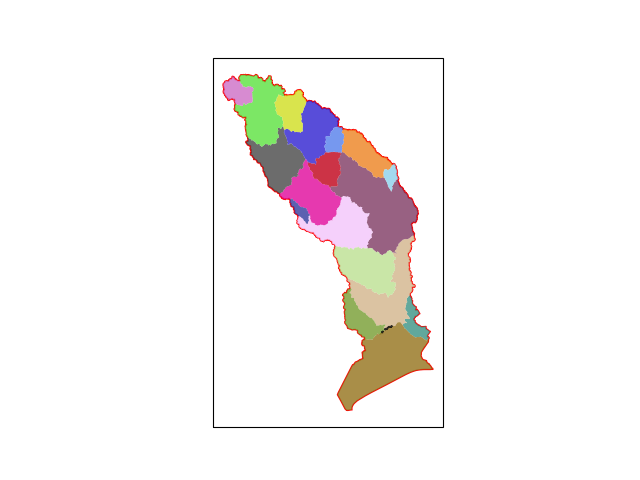

In [287]:
fig, ax = watershed_workflow.plot.get_ax(crs)

watershed_workflow.plot.shply(watershed_containing_basin, crs, 'r', ax)
watershed_workflow.plot.shplys(subdomains, crs, None, ax, facecolor='edge', alpha=0.8)
watershed_workflow.plot.shplys(missing_regions, crs, 'k', ax, alpha=0.8)

In [288]:
to_cleanup = []
for k,mr in enumerate(missing_regions):
    mr_buffer = mr.buffer(1.e-6)
    intersections = [i for (i,subdomain) in enumerate(subdomains) if mr_buffer.intersection(subdomain).area > 0]
    count = len(intersections)
    #print(k,count)
    if count == 1:
        my_i = intersections[0]
        props = subdomains[my_i].properties
        subdomains[my_i] = shapely.ops.unary_union([subdomains[my_i], mr_buffer])
        subdomains[my_i].properties = props
        #print(f'{k} is entirely contained in subdomain {my_i}')
    else:
        to_cleanup.append(mr)
        print(f'{k} is on {count} boundaries, {intersections}')

# note that the internal boundary and internal ones should already be done.  
# So should just be those with count == 1
#assert(len(to_cleanup) == 0)
assert(all(isinstance(poly, shapely.geometry.Polygon) for poly in subdomains))
assert(all(hasattr(poly, 'properties') for poly in subdomains))
print(len(to_cleanup))

0 is on 2 boundaries, [11, 17]
1 is on 2 boundaries, [1, 17]
2


Fixing the missing regions that touch two subdomains

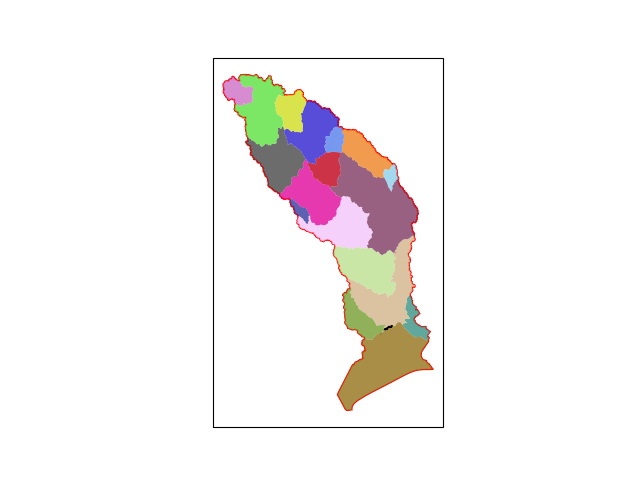

In [289]:
fig, ax = watershed_workflow.plot.get_ax(crs)

watershed_workflow.plot.shply(watershed_containing_basin, crs, 'r', ax)
watershed_workflow.plot.shplys(subdomains, crs, None, ax, facecolor='edge', alpha=0.8)
watershed_workflow.plot.shplys([to_cleanup[1]], crs, 'k', ax, facecolor='k', alpha=1)

In [290]:
# from visual inspection, the last missing region is to be merged into subdoomain
my_i = 11

props = subdomains[my_i].properties
subdomains[my_i] = shapely.ops.unary_union([subdomains[my_i], to_cleanup[0]])
subdomains[my_i].properties = props


my_i = 1
props = subdomains[my_i].properties
subdomains[my_i] = shapely.ops.unary_union([subdomains[my_i], to_cleanup[1]])
subdomains[my_i].properties = props

/Users/gpq/anaconda3/envs/watershed_workflow-master-2023-04-11/lib/python3.10/site-packages/pyproj/crs/crs.py:1282: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


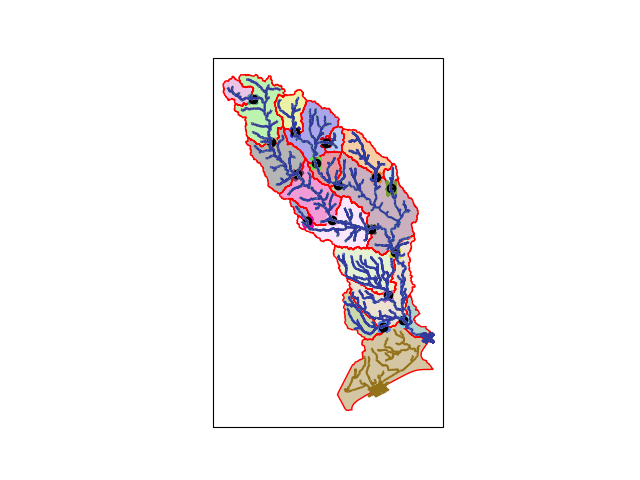

In [291]:
# ok, where are we at...

# set up a plotting function now that was have rivers, subdomains, gages
def plot(crs, subdomains, rivers, gages, color_by='river', mark_by='gage'):
    domain_colors = watershed_workflow.colors.enumerated_colors(len(subdomains), 1)
    fig, ax = watershed_workflow.plot.get_ax(crs)   

    if subdomains is not None:
        if isinstance(subdomains, list):
            subdomainPlotter = watershed_workflow.plot.shplys
        else:
            subdomainPlotter = watershed_workflow.plot.hucs
    
        subdomainPlotter(subdomains, crs, domain_colors, ax, facecolor='edge', alpha=0.4)
        subdomainPlotter(subdomains, crs, 'r', ax)

    if rivers is not None:
        if mark_by == 'all':
            markers = 'x'
        else:
            markers = None    
    
        if color_by == 'river' and len(rivers) == len(subdomains):
            for i,river in enumerate(rivers):
                watershed_workflow.plot.river(river, crs, domain_colors[i], ax, marker=markers)
                if mark_by == 'gage':
                    watershed_workflow.plot.shply(river.segment, crs, domain_colors[i], ax, marker='x')
        elif color_by == 'reach':
            watershed_workflow.plot.rivers(rivers, crs, None, ax, marker=markers)

    if gages is not None:
        watershed_workflow.plot.shplys(gages.geometry, crs, 'k', ax)
    return ax

ax = plot(crs, subdomains, trunk_reaches_pruned, gages_selected)
watershed_workflow.plot.shplys([to_cleanup[0]], crs, 'k', ax, facecolor='k', alpha=0.4)



In [ ]:
subs_no_props = [shapely.geometry.Polygon(s) for s in subdomains]
watershed_workflow.io.write_to_shapefile('subdomains.shp', subs_no_props, crs)

reaches_no_props = [shapely.geometry.LineString(s) for s in rivers[0]]
watershed_workflow.io.write_to_shapefile('reaches.shp', reaches_no_props, crs)

In [ ]:
# keep originals
rivers_orig = rivers_raw[:]
reaches_orig = [r for river in rivers_orig for r in river]
subdomains_orig = watershed_workflow.utils.deepcopy(subdomains)
watershed_orig = watershed_workflow.split_hucs.SplitHUCs(subdomains_orig)

In [ ]:
fig, ax = watershed_workflow.plot.get_ax(crs)

watershed_colors = watershed_workflow.colors.enumerated_colors(len(watershed_orig.gons))
watershed_workflow.plot.hucs(watershed_orig, crs,watershed_colors, ax,facecolor='edge', alpha=0.4)

river_colors = watershed_workflow.colors.enumerated_colors(len(rivers))
for i, river in enumerate(rivers):
    watershed_workflow.plot.rivers([river,], crs, river_colors[i], ax, linewidth=1)


# BREAK -- Create Mesh

In [ ]:
# make a copy to preserve originals for restart
subdomains_pristine = subdomains
subdomains = watershed_workflow.utils.deepcopy(subdomains_pristine)
watershed = watershed_workflow.split_hucs.SplitHUCs(subdomains)
rivers = [neches.deepcopy(),gv_bay.deepcopy()]
rivers_orig = [neches.deepcopy(),gv_bay.deepcopy()]
reaches = [r for r in rivers]

In [ ]:
for river in rivers:
    assert river.is_continuous()
    assert river.is_consistent()
for river in rivers:
    for r in river:
        assert(r.length > 0)

In [ ]:
# from here, rivers will be used to generate the corridor mesh
try:
    rivers = watershed_workflow.simplify(watershed, rivers, 
                                         simplify_hucs=200, simplify_rivers=160, 
                                         merge_tol=120, snap_tol=25, cut_intersections=True)
except watershed_workflow.utils.CutError as err:
    fig, ax = watershed_workflow.plot.get_ax(crs)   
    watershed_workflow.plot.shply(watershed_containing_basin, crs, 'k', ax, alpha=0.5)
    watershed_workflow.plot.hucs(watershed, crs, watershed_colors, ax, facecolor='edge', alpha=0.2)
    watershed_workflow.plot.river(rivers[0], crs, 'c', ax, alpha=0.4)

    watershed_workflow.plot.shply(err.line, crs, 'k', ax)
    watershed_workflow.plot.shply(err.seg, crs, 'r', ax, marker='x')
    watershed_workflow.plot.shply(err.cutline, crs, 'b', ax, marker='x')
    plt.show()
    raise err
else:
    # for plotting purpose only
    rivers_simplified = [r.deepcopy() for r in rivers]
    watershed_simplified = copy.deepcopy(watershed) 

    print('number of reaches in original', len([r for r in river for river in rivers_orig]), 'number of reaches in simplified', len([r for r in river for river in rivers]))

In [ ]:
for river in rivers:
    assert river.is_continuous()
    assert river.is_consistent()
for river in rivers:
    for r in river:
        assert(r.length > 0)

In [ ]:


# plotting results
def plot(ws, rvrs, title):
    fig, ax = watershed_workflow.plot.get_ax(crs)
    watershed_workflow.plot.hucs(ws, crs, 'k', ax, marker='x')
    ax.set_title(title, fontsize=16)
    for rvr in rvrs:
        reach_colors = watershed_workflow.colors.enumerated_colors(len(rvr))
        watershed_workflow.plot.river(rvr, crs, reach_colors, ax, marker='+')
    return fig

# they appear in reverse order
fig2 = plot(watershed_simplified, rivers_simplified, 'simplified')
fig1 = plot(watershed_orig, rivers_orig, 'original river network and hucs')
plt.show()

In [ ]:
#### CUSTOM ####
# fixing the outlet reach for the GV Bay outlet

seg = list(rivers[1].preOrder())[0].segment
seg_new = shapely.geometry.LineString(seg.coords[0:2])
list(rivers[1].preOrder())[0].segment = seg_new

rivers[0].parent = None


In [ ]:
for river in rivers:
    assert river.is_continuous()
    assert river.is_consistent()
for river in rivers:
    for r in river:
        assert(r.length > 0)

In [ ]:
# densify, adding back in points as needed
d0 = 50; d1 = 250
L0 = 200; L1 = 300

#densify_watershed
watershed_workflow.densification.densify_hucs(watershed, watershed_orig, rivers, limit_scales=[d0,L0,d1,L1]) 

#densify_river"
watershed_workflow.densification.densify_rivers(rivers, rivers_orig, limit=200)


In [ ]:
#### CUSTOM ####
# fixing the outlet reach for the GV Bay outlet
rivers[1]=(watershed_workflow.hydrography.cut_and_snap_crossings(watershed, [rivers[1]], tol=150))[0]
seg = rivers[1].segment
outlet_point = seg.intersection(watershed.exterior().exterior)
seg_new = shapely.geometry.LineString([seg.coords[0], outlet_point.coords[0]])
list(rivers[1].preOrder())[0].segment = seg_new 


# fixing the huc boundary at GV outlet (extra point is removed)
id = 68
huc_seg = list(watershed.segments)[id]
huc_seg_coords = huc_seg.coords[:]
huc_seg_coords.pop(3)
watershed.segments[id]= shapely.geometry.LineString(huc_seg_coords)


# fixing the huc boundary with two intersections with a reach
id = 55
huc_seg = list(watershed.segments)[id]
huc_seg_new_coords = huc_seg.coords[:]
huc_seg_new_coords.pop(1) 
huc_seg_new = shapely.geometry.LineString(huc_seg_new_coords)
watershed.segments[id] = huc_seg_new 


# ## reaches too close to the huc boundary
# node = rivers[0].getNode('4452936')
# new_seg_coords = node.segment.coords[:]
# new_seg_coords[-2] = (0.5*(new_seg_coords[-1][0]+new_seg_coords[-3][0]), 0.5+0.5*(new_seg_coords[-1][1]+new_seg_coords[-3][1]))
# node.segment = shapely.geometry.LineString(new_seg_coords)

# node = rivers[0].getNode('1166409')
# new_seg_coords = node.segment.coords[:]
# new_seg_coords[26] = shapely.geometry.Polygon(new_seg_coords[25:28]).centroid.coords[0]
# node.segment = shapely.geometry.LineString(new_seg_coords)

In [ ]:

# treat sharp angles
watershed_workflow.densification.remove_sharp_angles(rivers, watershed, angle_limit=30, junction_angle_limit=20, huc_seg_river_angle_limit=25, limit=200)


In [ ]:
for river in rivers:
    assert river.is_continuous()
for river in rivers:
    for r in river:
        assert(r.length > 0)

# they appear in reverse order
fig3 = plot(watershed, rivers, 'redensified')
plt.show()

## BREAK -- watersheds and rivers are now set!

In [ ]:
# how many types of Stream Orders are there
set([r.properties["streamorde"] for river in rivers  for r in river.preOrder()])

In [ ]:
for river in rivers:
    for node in river.preOrder():
        if node.properties["streamorde"]<0:
            node.properties["streamorde"]=5


In [ ]:
orders = [r.properties["streamorde"] for river in rivers  for r in river.preOrder()]

In [ ]:
## Triangulation. This step takes around 40min !!!

refine_d0 = 150 
refine_d1 = 400
refine_A0 = 10000
refine_A1 = 100000


d0 = refine_d0; d1 = refine_d1
A0 = refine_A0; A1 = refine_A1 

# Refine triangles if they get too acute
min_angle = 20 # degrees

# width of reach by stream order (order:width)
widths = dict({2:10,3:20,4:30,5:30, 5:35, 6:45}) 

fig = plt.figure()
ax = fig.add_subplot(111)
watershed_workflow.plot.hucs(watershed, None, None, ax)
error =None
try:
    mesh_points2, conn_list, areas, dists = watershed_workflow.tessalate_river_aligned(watershed, rivers, river_width=widths,
                                              refine_min_angle=min_angle, 
                                              refine_distance=[d0,A0,d1,A1], 
                                              #refine_max_area=200000,
                                              diagnostics=True, ax=ax)
except watershed_workflow.river_mesh.IntersectionError as err:
    error = err
    # fig = plt.figure()
    # ax = fig.add_subplot(111)
    # watershed_workflow.plot.hucs(watershed, None, None, ax)
    watershed_workflow.plot.shply(err.huc_segment, None, 'k', ax, marker='x')
    watershed_workflow.plot.shply(err.river_seg, None, 'b', ax, marker='+')
    watershed_workflow.plot.shply(err.point, None, 'r', ax, marker='^')
    plt.show()
    raise err
except Exception as err:
    plt.show()
    raise err

In [292]:
len(m2.conn)

677341

In [ ]:
# elems = [np.array(conn) for conn in conn_list if len(conn)==3]
# points = mesh_points2
# areas = np.array([watershed_workflow.utils.area(points[e]) for e in elems])
# print('maximum area of the triangle', round(max(areas),6) ,', minimum area of the triangle', round(min(areas),6), ', number of triangles', len(areas))

# # plot the resulting surface mesh
# fig = plt.figure(figsize=(10,10))
# ax = watershed_workflow.plot.get_ax(crs, fig)

# cbax = fig.add_axes([0.05,0.05,0.9,0.05])

# mp =ax.tripcolor(points[:,0], points[:,1], elems, areas, edgecolor='r')
# cbar = fig.colorbar(mp, orientation="horizontal", cax=cbax)
# ax.set_title('Triangulated Watershed with River-corridor as a Hole')
# #watershed_workflow.plot.hucs(watershed_modified, crs, ax=ax, color='k', linewidth=0.5)
# ax.set_aspect('equal', 'datalim')
# watershed_workflow.plot.hucs(watershed, None, 'c', ax)
# watershed_workflow.plot.rivers(rivers, None, 'b', ax)
# watershed_workflow.plot.shply(node.segment,None,'r', ax)

# # for point in tri_points:
# #     ax.plot(point[0], point[1], 'c-o', markersize=5)
# cbar.ax.set_title('triangle area [$m^2$]')

# plt.show()


In [ ]:
dem_profile, dem = watershed_workflow.get_raster_on_shape(sources['DEM'], watershed.exterior(), crs)

# replacing NaNs to zero
dem[np.isnan(dem)] = 0

# elevate the triangle nodes to the dem
mesh_points3 = watershed_workflow.elevate(mesh_points2, crs, dem, dem_profile)


In [ ]:
# construct the 2D mesh
m2 = watershed_workflow.mesh.Mesh2D(mesh_points3.copy(), conn_list)

In [ ]:
shapes = [shapely.geometry.Polygon(m2.coords[c, :]) for c in m2.conn]
area = np.array([shp.area for shp in shapes])
small = np.where(area < 500)[0]
centroids = m2.centroids


In [ ]:
domain_colors = watershed_workflow.colors.enumerated_colors(len(subdomains), 1)

In [ ]:
fig, ax = watershed_workflow.plot.get_ax(crs)

watershed_workflow.plot.hucs(watershed, crs, domain_colors, ax, facecolor='edge', alpha=0.6)
watershed_workflow.plot.hucs(watershed, crs, domain_colors, ax)
im = watershed_workflow.plot.shplys(shapes, crs, 'elevation', ax, cmap='terrain')
sc = ax.scatter(centroids[small,0], centroids[small,1], c=area[small], marker='o', s=20)
plt.colorbar(sc)
plt.show()


### Conditioning 

In [ ]:
# hydrologically condition the mesh, removing pits
river_mask=np.zeros((len(m2.conn)))
for i, elem in enumerate(m2.conn):
    if not len(elem)==3:
        river_mask[i]=1     
watershed_workflow.condition.fill_pits_dual(m2, is_waterbody=river_mask)

In [ ]:
# conditioning river mesh

# adding elevations to the river tree for stream bed conditioning
watershed_workflow.condition.elevate_rivers(rivers, crs, dem, dem_profile)

# conditioning the river mesh using NHD elevations and burning in the river
for river in rivers:
    for reach in river.preOrder():
        # print(reach.properties)
        # order = reach.properties['StreamOrder']
        area = reach.properties['TotalDrainageAreaSqKm'] # [km2]
        # reduction = order * a + b
        if area <= 10:  
            reduction = 2 # [m] 
        elif area <= 100: 
            reduction = 3 # [m] 
        elif area <= 1000: 
            reduction = 4.5 # [m]
        else:
            reduction = 5   # [m]
        
        reach.properties['elev_profile'] = reach.properties['elev_profile'] - reduction

    # Depths in the mesh are calculated from the centroid of the mesh elements. This means that by depressing the quad element, the centroid of the neighboring triangles will be depressed as well.
    # This means that the bankfull capacity of the river is less than the expected. To account for this, the river is depressed 2 times the initial value

    # River depths is estimated based on https://pubs.usgs.gov/sir/2020/5086/sir20205086.pdf and StreamStats
    # The below equations are based on the regression equations in the above report https://pubs.usgs.gov/sir/2020/5086/sir20205086.pdf.
    # The equations estimate the following river depths as function of drainage area
    # 10km2 --> 1m depth
    # 100km2 --> 1.5m depth
    # 1000km2 --> 2.2m depth
    # 2000km2 --> 2.5m depth


In [ ]:

# # conditioning the river mesh using NHD elevations
# watershed_workflow.condition.condition_river_meshes(m2, rivers,smooth=True, lower=True ,use_parent=True, network_burn_in_depth=0.5, depress_upstream_by=0.5)

for river in rivers:
    watershed_workflow.condition.condition_river_mesh(m2, river, lower=True, smooth=True)

In [ ]:
# Change all the property name "streamorde" to "StreamOrder" in all the elements in rivers
for river in rivers:
    for reach in river.preOrder():
        reach.properties['StreamOrder'] = reach.properties['streamorde']
        del reach.properties['streamorde']


In [ ]:
# add labeled sets for rivers based stream order. This is to easily set Manning values at each stream order.
watershed_workflow.regions.add_regions_by_stream_order_rivers(m2, rivers, labels=None)
#watershed_workflow.regions.add_regions_by_stream_order_rivers(m2, rivers, ['neches corridor', 'gv corridor'])

In [ ]:
# add labeled sets for subcatchments and outlets
watershed_workflow.regions.add_watershed_regions_and_outlets(m2, watershed, outlets=None, outlet_width=300, 
                                                             labels=[p.properties['name'] for p in watershed.polygons()])

In [ ]:
for ls in m2.labeled_sets:
    print(f'{ls.setid} : {ls.entity} : {len(ls.ent_ids)} : "{ls.name}"')

In [ ]:
# # save the variables m2 and rivers for later use. This is to avoid re-running the above steps
# name = 'neches'
# outputs['m2_temp'] = f'../../../global_data/meshes/{name}_m2_temp.pkl'
# outputs['rivers_temp'] = f'../../../global_data/meshes/{name}_rivers_temp.pkl'
# outputs['watershed_temp'] = f'../../../global_data/meshes/{name}_watershed_temp.pkl'
# outputs['subdomains_temp'] = f'../../../global_data/meshes/{name}_subdomains_temp.pkl'

# # save data
# with open(outputs['m2_temp'], 'wb') as f:
#     pickle.dump(m2, f)
# with open(outputs['rivers_temp'], 'wb') as f:
#     pickle.dump(rivers, f)
# with open(outputs['watershed_temp'], 'wb') as f:
#     pickle.dump(watershed, f)
# with open(outputs['subdomains_temp'], 'wb') as f:
#     pickle.dump(subdomains, f)

In [11]:
## Load the mesh and rivers from the saved files
crs = watershed_workflow.crs.daymet_crs()
name = 'neches'
outputs = {}
outputs['m2_temp'] = f'../../../global_data/meshes/{name}_m2_temp.pkl'
outputs['rivers_temp'] = f'../../../global_data/meshes/{name}_rivers_temp.pkl'
outputs['watershed_temp'] = f'../../../global_data/meshes/{name}_watershed_temp.pkl'
outputs['subdomains_temp'] = f'../../../global_data/meshes/{name}_subdomains_temp.pkl'

m2 = pickle.load(open(outputs['m2_temp'], 'rb'))
rivers = pickle.load(open(outputs['rivers_temp'], 'rb'))
watershed = pickle.load(open(outputs['watershed_temp'], 'rb'))
subdomains = pickle.load(open(outputs['subdomains_temp'], 'rb'))



/Users/gpq/anaconda3/envs/watershed_workflow-master-2023-04-11/lib/python3.10/site-packages/pyproj/crs/crs.py:1282: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


kwargs =  {'linewidth': 0, 'cmap': <matplotlib.colors.ListedColormap object at 0x13f071c00>, 'norm': <matplotlib.colors.BoundaryNorm object at 0x13f071810>, 'edgecolor': 'w'}
setting face color =  [110.51894569 121.24179343  96.4969464  ...  -1.61300004  -1.61300004
  -1.61300004]


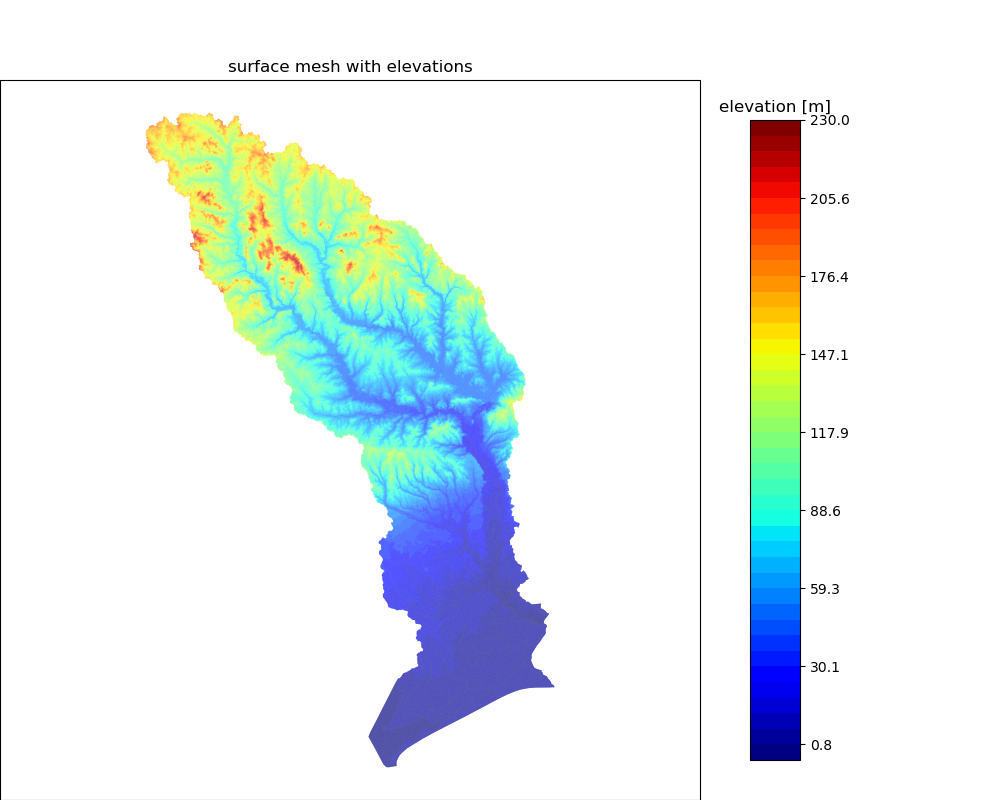

In [12]:
# plot the resulting surface mesh
start=min(m2.centroids[:,2])
step=(max(m2.centroids[:,2])-(min(m2.centroids[:,2])))/40
stop=max(m2.centroids[:,2])+step
legend_values=np.arange(start,stop,step)
indices, cmap, norm, ticks, labels = watershed_workflow.colors.generate_indexed_colormap(legend_values, cmap='jet')

# fig = plt.figure(figsize=figsize)
# ax = watershed_workflow.plot.get_ax(crs, fig, window=[0.05,0.1,0.9,0.8])
# cbax = fig.add_axes([0.05,0.05,0.9,0.05])

fig, ax = watershed_workflow.plot.get_ax(crs, figsize=(10,8), window=[0.,0.,0.7,0.9])
cbax = fig.add_axes([0.75,0.05,0.05,0.8])

mp = watershed_workflow.plot.mesh(m2, crs, ax=ax, 
                        linewidth=0 ,color=m2.centroids[:,2], 
                        cmap=cmap, norm = norm, edgecolor='w', facecolor='color')

# cbar = fig.colorbar(mp, orientation="horizontal", cax=cbax)
# set color bar in vertical
cbar = fig.colorbar(mp, orientation="vertical", cax=cbax)


# watershed_workflow.plot.rivers(rivers, crs, ax=ax, colors='b', linewidth=0.5)
# watershed_workflow.plot.hucs(watershed, crs, ax=ax, linewidth=1, facecolor='color', alpha=0.4)
ax.set_title('surface mesh with elevations')
ax.set_aspect('equal', 'datalim')

cbar.ax.set_title('elevation [m]')

plt.show()
fig.savefig(f'../images/{name}_dem_mesh')

## Surface properties

Meshes interact with data to provide forcing, parameters, and more in the actual simulation.  Specifically, we need vegetation type on the surface to provide information about transpiration and subsurface structure to provide information about water retention curves, etc.

We'll start by downloading and collecting land cover from the NLCD dataset, and generate sets for each land cover type that cover the surface.  Likely these will be some combination of grass, deciduous forest, coniferous forest, and mixed forest.

In [13]:
# Set land cover classes using NLCD
sources['land cover'] = watershed_workflow.source_list.FileManagerRaster('../../../global_data/land_cover/NLCD_2016_Land_Cover_L48/NLCD_2016_Land_Cover_L48.img')
lc_profile, lc_raster = watershed_workflow.get_raster_on_shape(sources['land cover'], 
                                                     watershed.exterior(), crs)

lc = watershed_workflow.values_from_raster(m2.centroids, crs, lc_raster, lc_profile)

# Convert to int
lc = lc.astype(int)

# Remove zero
# lc = lc[lc != 0]
# what land cover types did we get?
logging.info('Found land cover dtypes: {}'.format(lc.dtype))
logging.info('Found land cover types: {}'.format(set(lc)))

2024-04-03 14:17:37,792 - root - INFO: 
2024-04-03 14:17:37,792 - root - INFO: Loading Raster
2024-04-03 14:17:37,792 - root - INFO: ------------------------------
2024-04-03 14:17:37,793 - root - INFO: Collecting raster
2024-04-03 14:17:37,860 - root - INFO: bounds in my_crs: (6953.764230649981, 698123.389428819, 209160.8689471243, 1052294.9730360438)
2024-04-03 14:17:37,928 - root - INFO: ... got raster of shape: (11806, 6741)
2024-04-03 14:17:37,979 - root - INFO: ... got raster bounds: (6945.0, 1052295.0, 209175.0, 698115.0)
2024-04-03 14:17:38,667 - root - INFO: Found land cover dtypes: int64
2024-04-03 14:17:38,690 - root - INFO: Found land cover types: {71, 41, 42, 43, 11, 81, 82, 52, 21, 22, 23, 24, 90, 31, 95}


kwargs =  {'linewidth': 0, 'cmap': <matplotlib.colors.ListedColormap object at 0x15a923730>, 'norm': <matplotlib.colors.BoundaryNorm object at 0x15a9236d0>}
setting face color =  [42 42 43 ... 22 22 22]


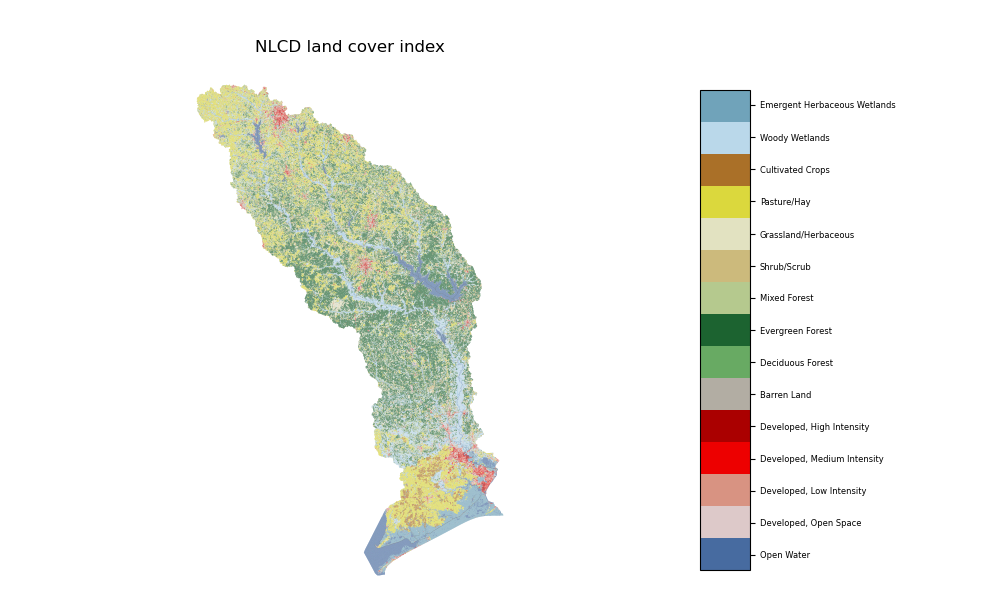

In [14]:
# nlcd_indices, nlcd_cmap, nlcd_norm, ticks, nlcd_labels = \
#         watershed_workflow.colors.generate_indexed_colormap(lc, cmap='tab20c')

nlcd_indices, nlcd_cmap, nlcd_norm, ticks, nlcd_labels = \
        watershed_workflow.colors.generate_nlcd_colormap(lc)

fig, ax = watershed_workflow.plot.get_ax(crs, figsize=(10,6), window=[0.,0.,0.7,0.9])
cax = fig.add_axes([0.7,0.05,0.05,0.8])

mp = watershed_workflow.plot.mesh(m2, crs, ax=ax, facecolor='color',
                        linewidth=0, color=lc, 
                        cmap=nlcd_cmap, norm=nlcd_norm
                       )

cbar = watershed_workflow.colors.colorbar_index(ncolors=len(np.unique(lc)), 
                                                cmap=nlcd_cmap, labels=nlcd_labels, cax=cax)
cbar.ax.tick_params(labelsize=6)

# # Find the pos of the values of lc equal to zero
# pos = np.where(lc == 0)
# # plot the centroid of those elements
# ax.scatter(m2.centroids[pos,0], m2.centroids[pos,1], c='k', marker='o', s=1)

ax.set_title('NLCD land cover index')
ax.axis('off')
plt.show()
fig.savefig(f'../images/{name}_land_cover')

In [15]:
# Plot the count and frequency of lc
unique_values, counts = np.unique(lc, return_counts=True)

for value, count in zip(unique_values, counts):
    print(f"{value}: {100*count/np.sum(counts)}")

11: 7.20582394982734
21: 2.6335331834334554
22: 2.0707442779929166
23: 0.8884741954200321
24: 0.367023404754769
31: 0.13774450387618645
41: 1.0634230025939666
42: 20.469896256095527
43: 8.448920115569559
52: 3.247699460094694
71: 3.796020025363886
81: 15.99253551756058
82: 0.9857664012661274
90: 27.32508441095401
95: 5.367311295196954


In [109]:
# Set Manning values, by mapping land cover classes to manning roughness
# Map the lc and open channel elements to manning values

# As reference, Village runs used Min from HEC-RAS 2D (https://www.hec.usace.army.mil/confluence/rasdocs/r2dum/latest/developing-a-terrain-model-and-geospatial-layers/creating-land-cover-mannings-n-values-and-impervious-layers)
# and Paola's paper for open channels (https://onlinelibrary.wiley.com/doi/full/10.1111/1752-1688.12987)

# [NLCD_ID Manning_value]
NLCD_Manning_values = {
    'Open Water' : [11, 0.025], 
    'Perennial Ice/Snow' : [12, 0.1], 
    'Developed, Open Space' : [21, 0.03],
    'Developed, Low Intensity' : [22, 0.06],
    'Developed, Medium Intensity' : [23, 0.08],
    'Developed, High Intensity' : [24, 0.12],
    'Barren Land' : [31, 0.023],
    'Deciduous Forest' : [41, 0.10],
    'Evergreen Forest' : [42, 0.08],
    'Mixed Forest' : [43, 0.08],
    'Dwarf Scrub' : [51, 0.025],   
    'Shrub/Scrub' : [52, 0.07],
    'Grassland/Herbaceous' : [71, 0.025],
    'Sedge/Herbaceous' : [72, 0.025],
    'Lichens'  : [73, 0.1],
    'Moss'   : [74, 0.1],
    'Pasture/Hay' : [81, 0.025],
    'Cultivated Crops' : [82, 0.020],
    'Woody Wetlands' : [90, 0.045],
    'Emergent Herbaceous Wetlands' : [95, 0.05],

    'Open Channel 1' : [60, 0.2],
    'Open Channel 2' : [61, 0.1],
    'Open Channel 3' : [62, 0.065],
    'Open Channel 4' : [63, 0.045],
    'Open Channel 5' : [64, 0.03],
    'Open Channel 6' : [65, 0.01],
   
}




# Get the new NLCV_manning_labels as a dataframe with index as the NLCD name and column with the nlcd id
NLCD_Manning_labels = pd.DataFrame.from_dict(NLCD_Manning_values, orient='index')




# rename columns
NLCD_Manning_labels.columns = ['NLCD', 'Manning value']
NLCD_Manning_labels
# save table
NLCD_Manning_labels.to_csv(f'../data-processed/{name}_NLCD_Manning.csv')


In [17]:
# get a hard copy of lc to add the open channel labels

lc_channels = lc.copy()

for ls in m2.labeled_sets:
    name_label = ls.name
    # Look for the labels that are StreamOrder
    if 'StreamOrder' in name_label:
        # find what streamorder is this label by looking the number after StreamOrder. Name has this formar "reaches of StreamOrder 6 in neches corridor surface"
        stream_order = int(name_label.split(' ')[3])
        # get list of index of the elements that have this stream order
        index = ls.ent_ids
        # replace the land cover of those elements by the corresponding open channel class
        lc_channels[index] = 59 + stream_order

# Count of lc with the open channel classes
unique_values, counts = np.unique(lc_channels, return_counts=True)

for value, count in zip(unique_values, counts):
    print(f"{value}: {100*count/np.sum(counts)}")

11: 6.567297712673528
21: 2.6136023066668046
22: 2.0556853933247803
23: 0.8806494808375692
24: 0.3653994073885975
31: 0.13169142278409252
41: 1.0501357514161995
42: 20.416747251384457
43: 8.376135506340233
52: 3.240612926133218
60: 0.21569637745242057
61: 0.8714960411373296
62: 0.8561418842207987
63: 0.46623488021543064
64: 0.5461060234062312
65: 0.14335467659568815
71: 3.7815516851925395
81: 15.844899393363166
82: 0.9816325897885998
90: 25.363738500991378
95: 5.231190788686939


/Users/gpq/anaconda3/envs/watershed_workflow-master-2023-04-11/lib/python3.10/site-packages/pyproj/crs/crs.py:1282: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


kwargs =  {'linewidth': 0, 'cmap': <matplotlib.colors.ListedColormap object at 0x15a9d24d0>, 'norm': <matplotlib.colors.BoundaryNorm object at 0x15a9d1570>}
setting face color =  [42 42 43 ... 60 60 60]


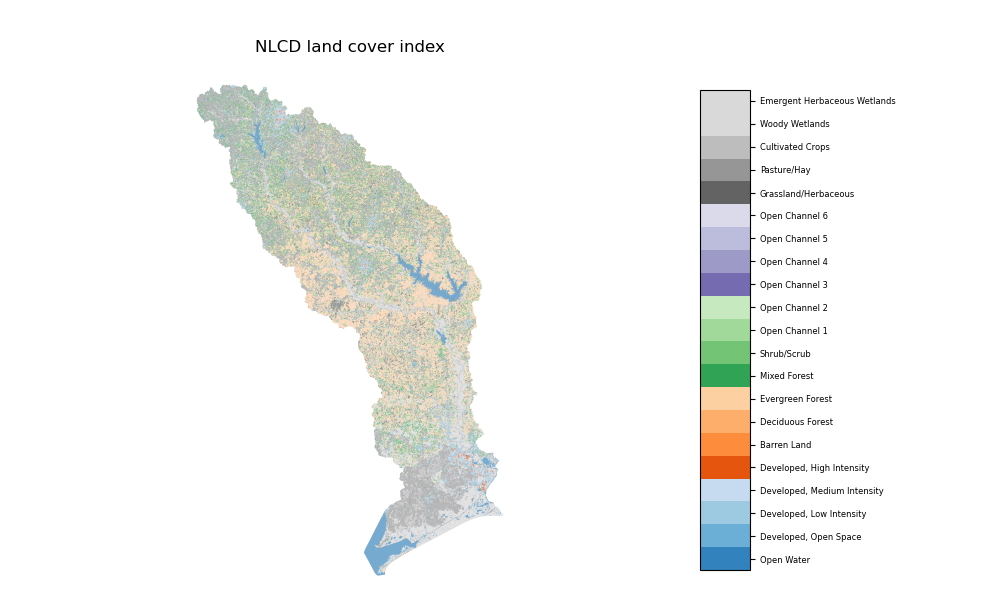

In [18]:
# do a new lc plot including the labels of the open channel classes

# Do a plot. Replace labels by NLCD labels
nlcd_indices, nlcd_cmap, nlcd_norm, ticks, nlcd_labels = \
        watershed_workflow.colors.generate_indexed_colormap(lc_channels, cmap='tab20c')

# replace nlcd labels
for key in nlcd_labels:
    nlcd_labels[np.where(np.array(nlcd_labels) == key)[0][0]] = NLCD_Manning_labels[NLCD_Manning_labels['NLCD']==int(key)].index[0]

fig, ax = watershed_workflow.plot.get_ax(crs, figsize=(10,6), window=[0.,0.,0.7,0.9])
cax = fig.add_axes([0.7,0.05,0.05,0.8])

mp = watershed_workflow.plot.mesh(m2, crs, ax=ax, facecolor='color',
                        linewidth=0, color=lc_channels, 
                        cmap=nlcd_cmap, norm=nlcd_norm
                       )

cbar = watershed_workflow.colors.colorbar_index(ncolors=len(np.unique(lc_channels)), 
                                                cmap=nlcd_cmap, labels=nlcd_labels, cax=cax)
cbar.ax.tick_params(labelsize=6)

ax.set_title('NLCD land cover index')
ax.axis('off')
plt.show()
fig.savefig(f'../images/{name}_land_cover_and_open_channels')

In [19]:
# create the manning vector for plotting with the same length that lc_channels

manning = np.zeros(len(lc_channels))

# convert manning using the NLCD_Manning_values dictionary
for key in NLCD_Manning_values:
    # get the index of the elements that have this land cover type
    index = np.where(lc_channels == NLCD_Manning_values[key][0])
    # replace the manning value of those elements by the corresponding manning value
    manning[index] = NLCD_Manning_values[key][1]



kwargs =  {'linewidth': 0, 'cmap': <matplotlib.colors.ListedColormap object at 0x3303310f0>, 'norm': <matplotlib.colors.BoundaryNorm object at 0x330332650>}
setting face color =  [0.08 0.08 0.08 ... 0.2  0.2  0.2 ]


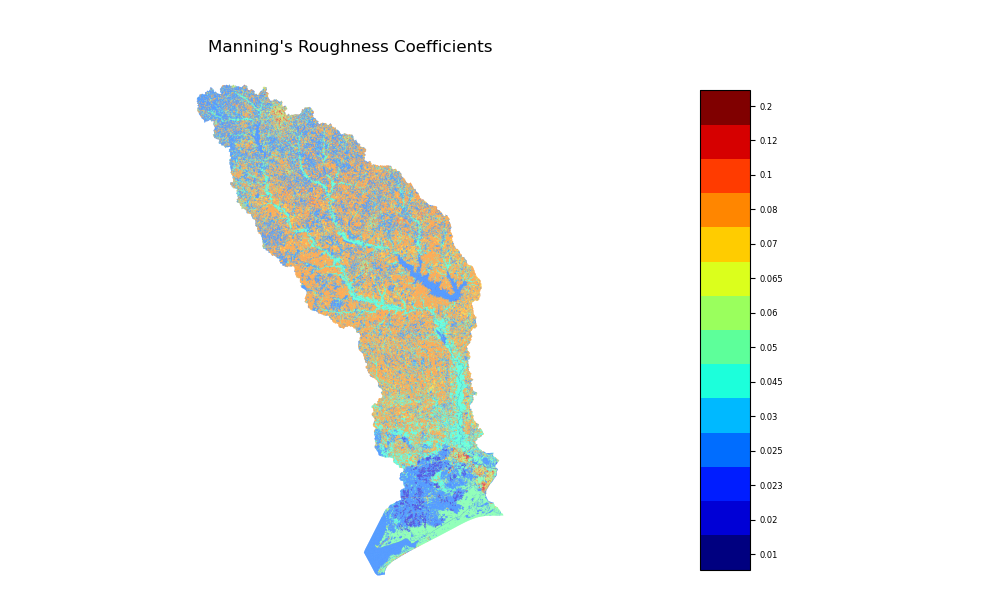

In [20]:
# Plot manning values

# Do aplot
indices, cmap, norm, ticks, labels = \
        watershed_workflow.colors.generate_indexed_colormap(manning, cmap='jet') # 'tab20c'
fig, ax = watershed_workflow.plot.get_ax(crs, figsize=(10,6), window=[0.,0.,0.7,0.9])
cax = fig.add_axes([0.7,0.05,0.05,0.8])

mp = watershed_workflow.plot.mesh(m2, crs, ax=ax, facecolor='color',
                        linewidth=0, color=manning, 
                        cmap=cmap, norm=norm
                       )

cbar = watershed_workflow.colors.colorbar_index(ncolors=len(np.unique(manning)), 
                                                cmap=cmap, labels=labels, cax=cax)
cbar.ax.tick_params(labelsize=6)

ax.set_title('Manning\'s Roughness Coefficients')
ax.axis('off')
plt.show()
fig.savefig(f'../images/{name}_manning')

In [21]:
# Download Land Cover data from MODIS to do correlated with NLCD data.
# Any year could be use as a reference

# download MODIS data for LAI, block until it is finished!
# Put credentials in manager_modis_appeears.py
start = datetime.date(2017,1,1) # Dates to extract the land use data
end = datetime.date(2018,1,1)
# NOTE: if you get an error here about MODIS AppEEARs username and password, realize that 
# you must register for a login in the AppEEARs database.  See:

# watershed_workflow.config.rcParams['AppEEARS']['username'] = 'gmesa0325'
# watershed_workflow.config.rcParams['AppEEARS']['password'] = 'XXX'

print(sources['lai'].__doc__)

modis = sources['lai'].get_data(watershed.exterior(), crs, start, end)
if not isinstance(modis, watershed_workflow.datasets.State):
    modis = sources['lai'].wait(modis)


# resample the raster to the triangles
modis_lc = watershed_workflow.values_from_raster(m2.centroids, crs, modis['LULC'].data[0,:,:], modis['LULC'].profile)

# what land cover types did we get?
logging.info('Found land cover dtypes: {}'.format(modis_lc.dtype))
logging.info('Found land cover types: {}'.format(set(modis_lc)))

2024-04-03 14:20:17,230 - root - INFO: ... searching for: /Users/gpq/ORNL/Projects/ATS_runs/global_data/land_cover/MODIS/modis_LAI_01-01-2017_01-01-2018_32.5525x-95.9357_29.3405x-93.8277.nc
2024-04-03 14:20:17,230 - root - INFO: ... searching for: /Users/gpq/ORNL/Projects/ATS_runs/global_data/land_cover/MODIS/modis_LULC_01-01-2017_01-01-2018_32.5525x-95.9357_29.3405x-93.8277.nc
2024-04-03 14:20:17,231 - root - INFO: ... reading LAI from /Users/gpq/ORNL/Projects/ATS_runs/global_data/land_cover/MODIS/modis_LAI_01-01-2017_01-01-2018_32.5525x-95.9357_29.3405x-93.8277.nc


MODIS data through the AppEEARS data portal.

    Note this portal requires authentication -- please enter a
    username and password in your .watershed_workflowrc file.  For
    now, as this is not the highest security data portal or workflow
    package, we expect you to store this password in plaintext.  Maybe
    we can improve this?  If it bothers you, please ask how you can
    contribute (the developers of this package are not security
    experts!)

    To enter the username and password, register for a login in the
    AppEEARs data portal at:

    .. [AppEEARs](https://appeears.earthdatacloud.nasa.gov/)
    
    Currently the variables supported here include LAI and estimated
    ET.  

    All data returned includes a time variable, which is in units of
    [days past Jan 1, 2000, 0:00:00.

    Note this is implemented based on the API documentation here:

       https://appeears.earthdatacloud.nasa.gov/api/?python#introduction

    


2024-04-03 14:20:17,853 - root - INFO: ... reading LULC from /Users/gpq/ORNL/Projects/ATS_runs/global_data/land_cover/MODIS/modis_LULC_01-01-2017_01-01-2018_32.5525x-95.9357_29.3405x-93.8277.nc
2024-04-03 14:20:18,451 - root - INFO: Found land cover dtypes: int16
2024-04-03 14:20:18,471 - root - INFO: Found land cover types: {1, 2, 4, 5, 8, 9, 10, 11, 12, 13, 14, 16, 17}


kwargs =  {'linewidth': 0, 'cmap': <matplotlib.colors.ListedColormap object at 0x33038b5e0>, 'norm': <matplotlib.colors.BoundaryNorm object at 0x33038b6d0>}
setting face color =  [ 8  8  9 ... 13  9  9]


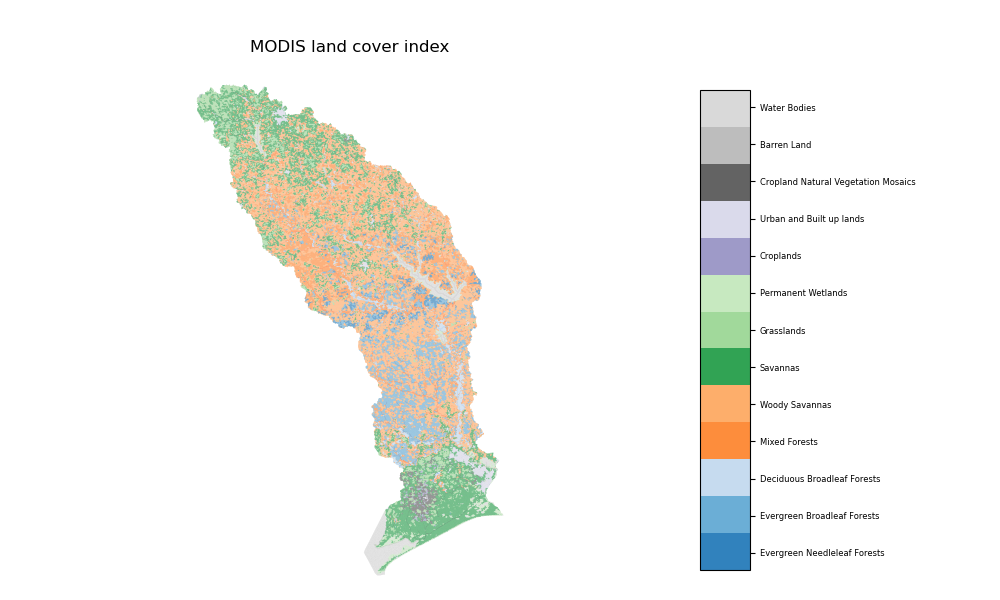

In [22]:
# Do a plot
modis_indices, modis_cmap, modis_norm, modis_ticks, modis_labels = \
        watershed_workflow.colors.generate_indexed_colormap(modis_lc, cmap='tab20c')

# Get the right labels, this is a bit of a hack
modis_indices_temp, modis_cmap_temp, modis_norm_temp, modis_ticks, modis_labels = \
                watershed_workflow.colors.generate_modis_colormap(modis_lc)

fig, ax = watershed_workflow.plot.get_ax(crs, figsize=(10,6), window=[0.,0.,0.7,0.9])
cax = fig.add_axes([0.7,0.05,0.05,0.8])

mp = watershed_workflow.plot.mesh(m2, crs, ax=ax, facecolor='color',
                        linewidth=0, color=modis_lc, 
                        cmap=modis_cmap, norm=modis_norm
                       )

cbar = watershed_workflow.colors.colorbar_index(ncolors=len(np.unique(modis_lc)), 
                                                cmap=modis_cmap, labels=modis_labels, cax=cax)
cbar.ax.tick_params(labelsize=6)

# cb = fig.colorbar(mp)
# cb.set_ticks(modis_ticks[0:len(modis_labels)])
# cb.set_ticklabels(modis_labels)

ax.set_title("MODIS land cover index")
ax.axis('off')
plt.show()
fig.savefig(f'../images/{name}_MODIS_land_cover')

In [187]:

# print in two columns 
for i in range(0, len(nlcd_indices)):
    print(f'{nlcd_indices[i]}: {nlcd_labels[i]}')


11: Open Water
21: Developed, Open Space
22: Developed, Low Intensity
23: Developed, Medium Intensity
24: Developed, High Intensity
31: Barren Land
41: Deciduous Forest
42: Evergreen Forest
43: Mixed Forest
52: Shrub/Scrub
60: Open Channel 1
61: Open Channel 2
62: Open Channel 3
63: Open Channel 4
64: Open Channel 5
65: Open Channel 6
71: Grassland/Herbaceous
81: Pasture/Hay
82: Cultivated Crops
90: Woody Wetlands
95: Emergent Herbaceous Wetlands


In [188]:
# print in two columns 
for i in range(0, len(modis_indices)):
    print(f'{modis_indices[i]}: {modis_labels[i]}')

1: Evergreen Needleleaf Forests
2: Evergreen Broadleaf Forests
4: Deciduous Broadleaf Forests
5: Mixed Forests
8: Woody Savannas
9: Savannas
10: Grasslands
11: Permanent Wetlands
12: Croplands
13: Urban and Built up lands
14: Cropland Natural Vegetation Mosaics
16: Barren Land
17: Water Bodies


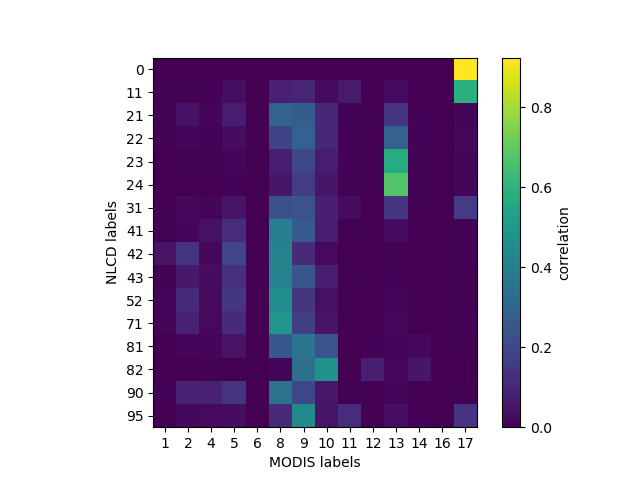

In [25]:

# determine a crosswalk between NLCD and MODIS -- for each NLCD index, 
# what MODIS index correlates best.  Note that while it is obvious here that
# all NLCD will map to MODIS 4, we do it anyway because this will not be true in general
crosswalk = watershed_workflow.land_cover_properties.compute_crosswalk_correlation(
    modis['LULC'].profile, modis['LULC'].data[0,:,:], lc_profile, lc_raster)

# This correlation is the proportion of common pixels between the two land covers over the total number of pixels of a NLCD land cover

# Note. This correlation is using the original raster resolution, not the mesh resolution. This means that some classes
# may appear in the correlation plot, since that the mesh resolution could be much coarser than the raster resolution. 
# This causes the correlation of 1.0 for the MODIS 4 and NLCD 82.

# This results shows that the MODIS land cover "Woody Savannas (MODIS label 8) and Evergreen Broadleaf Forests (MODIS label 2)" 
# have the higher correlation with the most of the NLCD land covers.
#  Since that the Woody Savannas are the predominant MODIS land cover, we will use the LAI from the Woody Savannas to represent
# the NLCD Evergreen forest LAI [-] class in the model

## Subsurface properties

The default model uses GLHYMPS to identify geologic formations, and 

In [26]:
# Check if the m2.centroids are whitin the watershed bounds
# mesh_points2
# for i in range(len(m2.centroids)):
#     if m2.centroids[i][0] < watershed.exterior().bounds[0] or m2.centroids[i][0] > watershed.exterior().bounds[2]:
#         print('x out of bounds')
#     if m2.centroids[i][1] < watershed.exterior().bounds[1] or m2.centroids[i][1] > watershed.exterior().bounds[3]:
#         print('y out of bounds')

In [27]:
#Find the subdomain to split in order to download SSURGO data (large domain)
# # #  make a figre
# # fig, ax = plt.subplots()

# # # plot watershed.polygon(1)
# # watershed_workflow.plot.shply(watershed.polygon(0), crs, 'k', ax, facecolor='k', alpha=0.4)
# # # watershed_workflow.plot.shply(watershed.polygon(1), crs, 'k', ax, facecolor='k', alpha=0.4)
# # # watershed_workflow.plot.shply(watershed.polygon(2), crs, 'k', ax, facecolor='k', alpha=0.4)
# # # watershed_workflow.plot.shply(watershed.polygon(3), crs, 'k', ax, facecolor='k', alpha=0.4)
# # # watershed_workflow.plot.shply(watershed.polygon(4), crs, 'k', ax, facecolor='k', alpha=0.4)
# # # watershed_workflow.plot.shply(watershed.polygon(5), crs, 'k', ax, facecolor='k', alpha=0.4)
# # # watershed_workflow.plot.shply(watershed.polygon(6), crs, 'k', ax, facecolor='k', alpha=0.4)
# # # watershed_workflow.plot.shply(watershed.polygon(7), crs, 'k', ax, facecolor='k', alpha=0.4)
# # # watershed_workflow.plot.shply(watershed.polygon(8), crs, 'k', ax, facecolor='k', alpha=0.4)
# # # watershed_workflow.plot.shply(watershed.polygon(9), crs, 'k', ax, facecolor='k', alpha=0.4)
# # # watershed_workflow.plot.shply(watershed.polygon(10), crs, 'k', ax, facecolor='k', alpha=0.4)
# # # watershed_workflow.plot.shply(watershed.polygon(11), crs, 'k', ax, facecolor='k', alpha=0.4)
# # # watershed_workflow.plot.shply(watershed.polygon(12), crs, 'k', ax, facecolor='k', alpha=0.4)
# # # watershed_workflow.plot.shply(watershed.polygon(13), crs, 'k', ax, facecolor='k', alpha=0.4)
# # # watershed_workflow.plot.shply(watershed.polygon(14), crs, 'k', ax, facecolor='k', alpha=0.4)
# # # watershed_workflow.plot.shply(watershed.polygon(15), crs, 'k', ax, facecolor='k', alpha=0.4)
# # # watershed_workflow.plot.shply(watershed.polygon(16), crs, 'k', ax, facecolor='k', alpha=0.4)
# # # watershed_workflow.plot.shply(watershed.polygon(17), crs, 'k', ax, facecolor='k', alpha=0.4)

# watershed_workflow.plot.shply(watershed.exterior(), crs, 'k', ax, facecolor='k', alpha=0.4)

# Define large_poly
poly_to_split = watershed.polygon(2)
# Define the cutting line
centroid = poly_to_split.centroid
x, y = centroid.coords[0]
line = LineString([(x - 1000000, y), (x + 1000000, y)])
# Split the polygon using the line
subdomain_split = list(split(poly_to_split, line))

# create a deep copy of the subdomain
new_subdomains = copy.deepcopy(subdomains)

# remove the old suddomain in pos 2, and append the new subdomains
new_subdomains.pop(2)
new_subdomains.append(subdomain_split[0])
new_subdomains.append(subdomain_split[1])

In [28]:
soil_profile, soil_survey, soil_survey_props = \
        watershed_workflow.get_shapes(sources['soil structure'], list(new_subdomains[:]),
                                      crs, crs, properties=True, split_download=True)

2024-04-03 14:22:09,826 - root - INFO: 
2024-04-03 14:22:09,826 - root - INFO: Loading shapes
2024-04-03 14:22:09,827 - root - INFO: ------------------------------
2024-04-03 14:22:09,905 - root - INFO: Attempting to download source for target '/Users/gpq/ORNL/Projects/ATS_runs/global_data/soil_structure/SSURGO/SSURGO_-94.1377_29.9465_-93.8088_30.3848.shp'
2024-04-03 14:22:09,952 - root - INFO:   Found 1937 shapes.
2024-04-03 14:22:09,953 - root - INFO:   and crs: epsg:4326
2024-04-03 14:22:09,958 - root - INFO: Attempting to download source for target '/Users/gpq/ORNL/Projects/ATS_runs/global_data/soil_structure/SSURGO/SSURGO_-94.7271_30.0494_-93.9234_30.9837.shp'
2024-04-03 14:22:10,249 - root - INFO:   Found 13919 shapes.
2024-04-03 14:22:10,250 - root - INFO:   and crs: epsg:4326
2024-04-03 14:22:10,255 - root - INFO: Attempting to download source for target '/Users/gpq/ORNL/Projects/ATS_runs/global_data/soil_structure/SSURGO/SSURGO_-95.2129_30.8304_-94.3526_31.3772.shp'
2024-04-03

In [29]:
# soil_profile, soil_survey, soil_survey_props = \
#         watershed_workflow.get_shapes(sources['soil structure'], [watershed.exterior(),],
#                                       crs, crs, properties=True)


In [30]:
Load_SSURGO = True

if not Load_SSURGO:

    # download the NRCS soils data as shapes and project it onto the mesh
    # If an error appears then, the certifies need to set equal to False (manager_nrcs.py) requests.post(self.url_data, data=data, verify=False)
    # -- download the shapes


    # soil_profile, soil_survey, soil_survey_props = \
    #         watershed_workflow.get_shapes(sources['soil structure'], [watershed.exterior(),],
    #                                       crs, crs, properties=True)

    # -- determine the NRCS mukey for each soil unit; this uniquely identifies soil 
    #    properties
    soil_ids = np.array(soil_survey_props['mukey'][:], np.int32)
    soil_survey_props.set_index('mukey', inplace=True, drop=False)
    # soil_survey_props = soil_survey_props.loc[np.unique(soil_color), :]

    # Make the watershed bounds slighly larger to make sure that all the soil polygons are included. 
    watershed_bounds = [watershed.exterior().bounds[0]-20, watershed.exterior().bounds[1]-20, watershed.exterior().bounds[2]+20, watershed.exterior().bounds[3]+20]

    # -- color a raster by the polygons (this makes identifying a triangle's value much 
    #    more efficient)
    soil_color_profile, soil_color_raster = watershed_workflow.color_raster_from_shapes(soil_survey, crs, soil_ids,
                                                                                        watershed_bounds, 10, crs, -1)

    # soil_color_profile, soil_color_raster = watershed_workflow.color_raster_from_shapes(soil_survey, crs, soil_ids,
    #                                                                                     watershed.exterior().bounds, 10, crs, -1)

    # -- resample the raster to the triangles
    soil_color = watershed_workflow.values_from_raster(m2.centroids, crs, 
                                            soil_color_raster, soil_color_profile, algorithm='nearest') # 'nearest' 'piecewise bilinear'

    # save soil_survey_props and soil_colors to don't load it again
    outputs['soil_survey_props'] = f'../../../global_data/meshes/{name}_soil_survey_props_temp.pkl'
    outputs['soil_color'] = f'../../../global_data/meshes/{name}_soil_color_temp.pkl'

    # save data
    with open(outputs['soil_survey_props'], 'wb') as f:
        pickle.dump(soil_survey_props, f)
    with open(outputs['soil_color'], 'wb') as f:
        pickle.dump(soil_color, f)

else:
    # load soil_survey_props and soil_colors
    outputs['soil_survey_props'] = f'../../../global_data/meshes/{name}_soil_survey_props_temp.pkl'
    outputs['soil_color'] = f'../../../global_data/meshes/{name}_soil_color_temp.pkl'

    # load data
    with open(outputs['soil_survey_props'], 'rb') as f:
        soil_survey_props = pickle.load(f)
    with open(outputs['soil_color'], 'rb') as f:
        soil_color = pickle.load(f)

    

soil_survey_props

,mukey,residual saturation [-],Rosetta porosity [-],van Genuchten alpha [Pa^-1],van Genuchten n [-],Rosetta permeability [m^2],thickness [cm],permeability [m^2],porosity [-],bulk density [g/cm^3],total sand pct [%],total silt pct [%],total clay pct [%],source
mukey,,,,,,,,,,,,,,
363783,363783,0.273007,0.490798,0.000089,1.277146,1.561165e-13,203.0,2.075912e-14,0.460443,1.343103,15.420197,28.778818,55.800985,NRCS
363789,363789,0.249554,0.521195,0.000075,1.319708,3.104307e-13,203.0,2.000000e-15,0.528957,1.200000,14.568966,35.431034,50.000000,NRCS
363796,363796,0.177187,0.374718,0.000167,1.483510,4.634823e-13,178.0,2.412447e-12,0.400487,1.515449,67.991386,20.727715,11.280899,NRCS
363801,363801,0.227770,0.402504,0.000079,1.383127,1.466453e-13,203.0,2.317765e-14,0.427389,1.435222,40.199507,36.320690,23.479803,NRCS
363802,363802,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NRCS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3009460,3009460,0.175263,0.407994,0.000161,1.503612,7.454593e-13,203.0,1.070324e-12,0.631527,1.392020,70.133498,17.248276,12.618227,NRCS
3100753,3100753,0.252387,0.432744,0.000079,1.336146,1.307706e-13,203.0,3.725695e-13,0.437327,1.403010,32.674433,32.729507,34.596059,NRCS
3220253,3220253,0.133235,0.368627,0.000357,3.871812,1.451681e-11,203.0,1.174083e-11,0.420113,1.536059,98.265025,0.000000,1.734975,NRCS


Select only the soils within the watershed

/Users/gpq/anaconda3/envs/watershed_workflow-master-2023-04-11/lib/python3.10/site-packages/pyproj/crs/crs.py:1282: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


kwargs =  {'linewidth': 0.5, 'cmap': <matplotlib.colors.ListedColormap object at 0x344526e30>}
setting face color =  [0.39325688 0.35684729 0.41407895 ...        nan        nan        nan]
Median porosity [-] =  0.42221674876847287


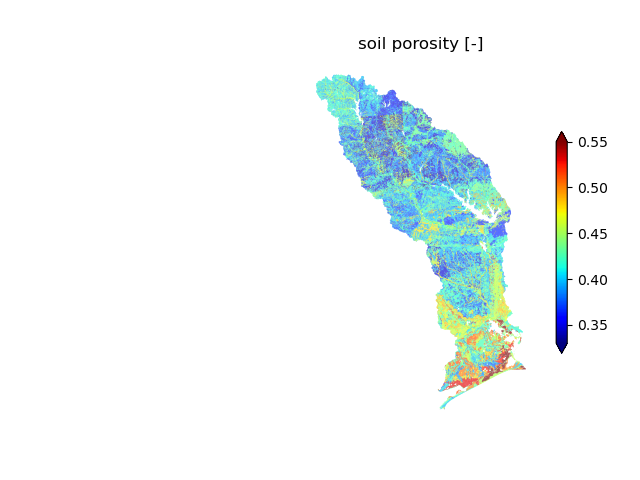

In [31]:
# plot of porosity from SSURGO
iprop = np.empty(soil_color.shape, 'd')
for mukey in soil_survey_props['mukey']:
    # iprop[soil_color == mukey] = soil_survey_props.loc[ mukey,'porosity [-]']
    iprop[soil_color == mukey] = soil_survey_props[soil_survey_props['mukey']==mukey]['porosity [-]'].values[0]

pmin_plot = 0.33
pmax_plot = 0.55

fig, ax = watershed_workflow.plot.get_ax(crs)
indices, cmap, norm, ticks, labels = watershed_workflow.colors.generate_indexed_colormap(iprop, cmap='jet')
mp = watershed_workflow.plot.mesh(m2, crs, ax=ax,
                        linewidth=0.5, color=iprop, cmap=cmap, facecolor='color', vmin=pmin_plot, vmax=pmax_plot)

# mp = watershed_workflow.plot.triangulation(mesh_points3, mesh_tris, crs, ax=ax, 
#                                  color=iprop, edgecolor='gray', cmap='jet')
ax.set_title('soil porosity [-]')
cb = fig.colorbar(mp, fraction=0.04, pad=0.04, extend="both", shrink=0.6)
ax.axis('off')



print('Median porosity [-] = ', np.nanmedian(iprop))
plt.show()
fig.savefig(f'../images/{name}_soil_porosity')

/var/folders/2f/3qcvb5n94gjgnh1b6hsrwxy09rfxld/T/ipykernel_69723/566164952.py:11: RuntimeWarning: divide by zero encountered in log10
  indices, cmap, norm, ticks, labels = watershed_workflow.colors.generate_indexed_colormap(np.log10(iprop), cmap='jet')
/var/folders/2f/3qcvb5n94gjgnh1b6hsrwxy09rfxld/T/ipykernel_69723/566164952.py:13: RuntimeWarning: divide by zero encountered in log10
  linewidth=0.5, color=np.log10(iprop), cmap=cmap, facecolor='color')


kwargs =  {'linewidth': 0.5, 'cmap': <matplotlib.colors.ListedColormap object at 0x332e94d00>}
setting face color =  [-13.07870919 -11.43903567 -12.04575749 ...          nan          nan
          nan]
Min k [m^2] =  0.0


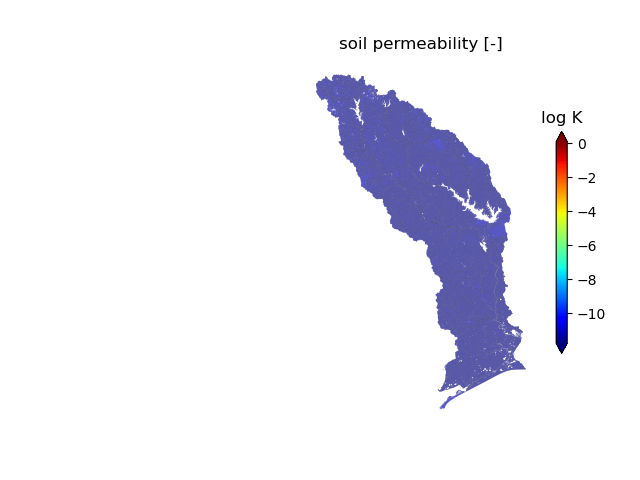

In [32]:
# plot of permeability
iprop = np.empty(soil_color.shape, 'd')
for mukey in soil_survey_props['mukey']:
    # iprop[soil_color == mukey] = soil_survey_props.loc[ mukey,'porosity [-]']
    iprop[soil_color == mukey] = soil_survey_props[soil_survey_props['mukey']==mukey]['permeability [m^2]'].values[0]
# for mukey in soil_survey_props.index:
#     iprop[soil_color == mukey] = soil_survey_props.loc[ mukey,'permeability [m^2]']

fig, ax = watershed_workflow.plot.get_ax(crs)

indices, cmap, norm, ticks, labels = watershed_workflow.colors.generate_indexed_colormap(np.log10(iprop), cmap='jet')
mp = watershed_workflow.plot.mesh(m2, crs, ax=ax,
                        linewidth=0.5, color=np.log10(iprop), cmap=cmap, facecolor='color')

# mp = watershed_workflow.plot.triangulation(mesh_points3, mesh_tris, crs, ax=ax, 
#                                  color=np.log10(iprop), edgecolor='gray', cmap='jet')
ax.set_title('soil permeability [-]')
cb = fig.colorbar(mp, fraction=0.04, pad=0.04, extend="both", shrink=0.6)
cb.ax.set_title('log K')
ax.axis('off')

print('Min k [m^2] = ', np.nanmin(iprop))
plt.show()
fig.savefig(f'../images/{name}_soil_permeability')

In [33]:
# Note the missing data (white).  This is because some SSURGO map units have no formation with complete 
# information.  So we merge the above available data, filling where possible and dropping regions that
# do not have a complete set of properties.
soil_survey_props_clean = soil_survey_props.copy()

# later scripts expect 'native_index' as a standard name of holding onto the original IDs
soil_survey_props_clean.rename_axis('native_index', inplace=True)
soil_survey_props_clean.rename(columns={'mukey':'native_index'}, inplace=True)

# need thickness in m
soil_survey_props_clean['thickness [cm]'] = soil_survey_props_clean['thickness [cm]']/100.
soil_survey_props_clean.rename(columns={'thickness [cm]':'thickness [m]'}, inplace=True)

# clean data
def replace_column_nans(df, col_nan, col_replacement):
    """In a df, replace col_nan entries by col_replacement if is nan.  In Place!"""
    row_indexer = df[col_nan].isna()
    df.loc[row_indexer, col_nan] = df.loc[row_indexer, col_replacement]
    return

# where poro or perm is nan, put Rosetta poro
replace_column_nans(soil_survey_props_clean, 'porosity [-]', 'Rosetta porosity [-]')
replace_column_nans(soil_survey_props_clean, 'permeability [m^2]', 'Rosetta permeability [m^2]')

# drop unnecessary columns
for col in ['Rosetta porosity [-]', 'Rosetta permeability [m^2]', 'bulk density [g/cm^3]', 'total sand pct [%]',
            'total silt pct [%]', 'total clay pct [%]']:
    soil_survey_props_clean.pop(col)
    
# drop nans
soil_survey_props_clean.dropna(inplace=True)
soil_survey_props_clean.reset_index(drop=True, inplace=True)
soil_survey_props_clean.rename_axis('native_index', inplace=True)

assert soil_survey_props_clean['porosity [-]'][:].min() >= min_porosity
assert soil_survey_props_clean['permeability [m^2]'][:].max() <= max_permeability


# print the min and max of the porosity and permeability
print('min porosity', soil_survey_props_clean['porosity [-]'][:].min())
print('max porosity', soil_survey_props_clean['porosity [-]'][:].max())

soil_survey_props_clean

min porosity 0.30787401574803147
max porosity 0.7406781094983319


,native_index,residual saturation [-],van Genuchten alpha [Pa^-1],van Genuchten n [-],thickness [m],permeability [m^2],porosity [-],source
native_index,,,,,,,,
0,363783,0.273007,0.000089,1.277146,2.03,2.075912e-14,0.460443,NRCS
1,363789,0.249554,0.000075,1.319708,2.03,2.000000e-15,0.528957,NRCS
2,363796,0.177187,0.000167,1.483510,1.78,2.412447e-12,0.400487,NRCS
3,363801,0.227770,0.000079,1.383127,2.03,2.317765e-14,0.427389,NRCS
4,366063,0.235830,0.000070,1.351201,1.52,2.913497e-14,0.515556,NRCS
...,...,...,...,...,...,...,...,...
1278,3009460,0.175263,0.000161,1.503612,2.03,1.070324e-12,0.631527,NRCS
1279,3100753,0.252387,0.000079,1.336146,2.03,3.725695e-13,0.437327,NRCS
1280,3220253,0.133235,0.000357,3.871812,2.03,1.174083e-11,0.420113,NRCS


/Users/gpq/anaconda3/envs/watershed_workflow-master-2023-04-11/lib/python3.10/site-packages/pyproj/crs/crs.py:1282: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


kwargs =  {'linewidth': 0, 'cmap': <matplotlib.colors.ListedColormap object at 0x332e5eb30>, 'norm': <matplotlib.colors.BoundaryNorm object at 0x332e5d8d0>}
setting face color =  [577090. 575627. 575340. ... 374939. 374939. 374939.]


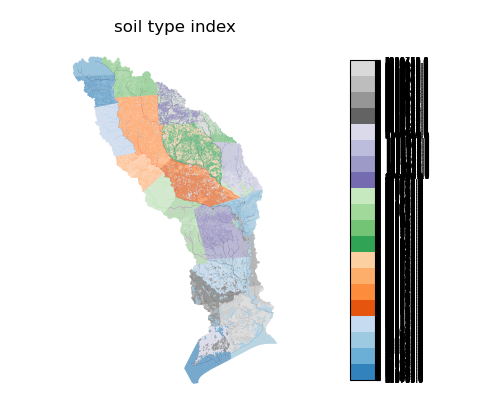

In [34]:
# plot the soil mukey
indices, cmap, norm, ticks, labels = \
        watershed_workflow.colors.generate_indexed_colormap(soil_color, cmap='tab20c')
fig, ax = watershed_workflow.plot.get_ax(crs, figsize=(5,4), window=[0.,0.,0.7,0.9])
cax = fig.add_axes([0.7,0.05,0.05,0.8])

mp = watershed_workflow.plot.mesh(m2, crs, ax=ax, facecolor='color',
                        linewidth=0, color=soil_color, 
                        cmap=cmap, norm=norm
                       )

cbar = watershed_workflow.colors.colorbar_index(ncolors=len(np.unique(soil_color)), 
                                                cmap=cmap, labels=labels, cax=cax)
cbar.ax.tick_params(labelsize=6)

ax.set_title('soil type index')
ax.axis('off')
plt.show()

In [35]:
print('min permeability', np.log10(soil_survey_props_clean['permeability [m^2]'][:].min()))
print('max permeability', np.log10(soil_survey_props_clean['permeability [m^2]'][:].max()))

min permeability -15.19669201672849
max permeability -10.698970004336019


In [37]:
# create a new soil_color, keeping on those that are kept here and re-indexing to ATS indices
soil_color_new = -np.ones_like(soil_color)
# for new_id, mukey in enumerate(soil_survey_props_clean['mukey']):
#     soil_color_new[np.where(soil_color == mukey)] = 2000+new_id

for new_id, mukey in enumerate(soil_survey_props_clean['native_index']):
    soil_color_new[np.where(soil_color == mukey)] = 2000+new_id

kwargs =  {'linewidth': 0, 'cmap': <matplotlib.colors.ListedColormap object at 0x333327a60>, 'norm': <matplotlib.colors.BoundaryNorm object at 0x333327c40>}
setting face color =  [ 2.709e+03  2.501e+03  2.378e+03 ... -1.000e+00 -1.000e+00 -1.000e+00]


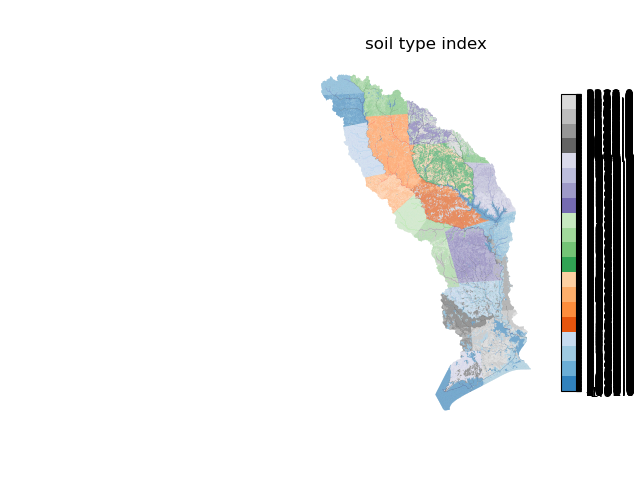

In [38]:
# image the new soil_color
indices, cmap, norm, ticks, labels = watershed_workflow.colors.generate_indexed_colormap(soil_color_new, cmap='tab20c')
fig, ax = watershed_workflow.plot.get_ax(crs)

mp = watershed_workflow.plot.mesh(m2, crs, ax=ax, facecolor='color',
                        linewidth=0, color=soil_color_new, 
                        cmap=cmap, norm=norm)

watershed_workflow.colors.colorbar_index(ncolors=len(np.unique(soil_color_new)), cmap=cmap, labels=labels) 

ax.set_title('soil type index')
ax.axis('off')
plt.show()
fig.savefig(f'../images/{name}_soil_indices')

### GLYHMPS geologic layer

GLYHMPS is complete in that it does not appear to have missing data, but does not have texture properties needed for Water Retention Models.  Instead we rely on scaling laws to fill the data.

In [39]:
Load_GLYHMPS = True

if not Load_GLYHMPS:

    # extract the GLYHMPS geologic structure data as shapes and project it onto the mesh
    target_bounds = watershed.exterior().bounds
    logging.info('target bounds: {}'.format(target_bounds))

    _, geo_survey, geo_survey_props = watershed_workflow.get_shapes(sources['geologic structure'], 
                                                        target_bounds, crs, crs, properties=True,
                                                        min_porosity=min_porosity, 
                                                        max_permeability=max_permeability,
                                                        max_vg_alpha=max_vg_alpha)

    # # -- log the bounds targeted and found
    # logging.info('shape union bounds: {}'.format(
    #     shapely.ops.cascaded_union(geo_survey).bounds))

    valid_geometries = [geom for geom in geo_survey if geom and not geom.is_empty and geom.is_valid]

    if valid_geometries:
        union_result = shapely.ops.cascaded_union(valid_geometries)
        logging.info('shape union bounds: {}'.format(union_result.bounds))
    else:
        logging.warning('No valid geometries found in geo_survey')


    # -- determine the ID for each soil unit; this uniquely identifies formation
    #    properties
    geo_ids = np.array([shp.properties['id'] for shp in geo_survey], np.int32)

    # -- color a raster by the polygons (this makes identifying a triangle's value much 
    #    more efficient)

    # Make the watershed bounds slighly larger to make sure that all the soil polygons are included. 
    watershed_bounds = [watershed.exterior().bounds[0]-20, watershed.exterior().bounds[1]-20, watershed.exterior().bounds[2]+20, watershed.exterior().bounds[3]+20]

    geo_color_profile, geo_color_raster = \
                watershed_workflow.color_raster_from_shapes(geo_survey, crs, geo_ids,
                                                            watershed_bounds, 10, crs, -1)

    # -- resample the raster to the triangles
    geo_color = watershed_workflow.values_from_raster(m2.centroids, crs, 
                                            geo_color_raster, geo_color_profile, algorithm='nearest') # 'nearest' 'piecewise bilinear'
    

    # save soil_survey_props and soil_colors to don't load it again
    outputs['geo_survey_props'] = f'../../../global_data/meshes/{name}_geo_survey_props_temp.pkl'
    outputs['geo_color'] = f'../../../global_data/meshes/{name}_geo_color_temp.pkl'

    # save data
    with open(outputs['geo_survey_props'], 'wb') as f:
        pickle.dump(geo_survey_props, f)
    with open(outputs['geo_color'], 'wb') as f:
        pickle.dump(geo_color, f)

else:
    # load soil_survey_props and soil_colors
    outputs['geo_survey_props'] = f'../../../global_data/meshes/{name}_geo_survey_props_temp.pkl'
    outputs['geo_color'] = f'../../../global_data/meshes/{name}_geo_color_temp.pkl'

    # load data
    with open(outputs['geo_survey_props'], 'rb') as f:
        geo_survey_props = pickle.load(f)
    with open(outputs['geo_color'], 'rb') as f:
        geo_color = pickle.load(f)

In [40]:
np.min(geo_color)

-1.0

In [41]:
# select the properties that appear in the mesh
geo_survey_props.set_index('id', inplace=True, drop=False)
# geo_survey_props = geo_survey_props.loc[np.unique(geo_color), :]
geo_survey_props = geo_survey_props.loc[np.unique(geo_color[geo_color != -1]), :]

/Users/gpq/anaconda3/envs/watershed_workflow-master-2023-04-11/lib/python3.10/site-packages/pyproj/crs/crs.py:1282: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


kwargs =  {'linewidth': 0, 'cmap': <matplotlib.colors.ListedColormap object at 0x33131cb50>, 'norm': <matplotlib.colors.BoundaryNorm object at 0x33131fca0>}
setting face color =  [ 601093. 1792075.  675627. ... 1791057. 1791057. 1791057.]


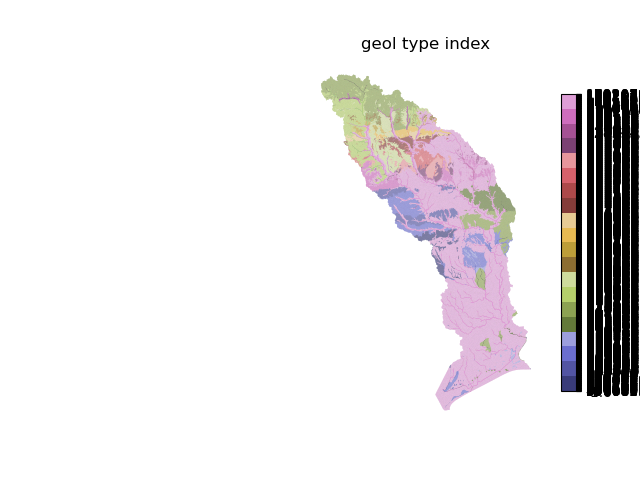

In [42]:
# plot the geologic formation id
indices, cmap, norm, ticks, labels = watershed_workflow.colors.generate_indexed_colormap(geo_color, cmap='tab20b')

fig, ax = watershed_workflow.plot.get_ax(crs)

mp = watershed_workflow.plot.mesh(m2, crs, ax=ax, facecolor='color',
                        linewidth=0, color=geo_color, 
                        cmap=cmap, norm=norm)

watershed_workflow.colors.colorbar_index(ncolors=len(np.unique(geo_color)), cmap=cmap, labels=labels) 

ax.set_title('geol type index')
ax.axis('off')
plt.show()
fig.savefig(f'../images/{name}_geo_index')

In [43]:
np.min(geo_color)

-1.0

/var/folders/2f/3qcvb5n94gjgnh1b6hsrwxy09rfxld/T/ipykernel_69723/3173823990.py:13: RuntimeWarning: divide by zero encountered in log10
  indices, cmap, norm, ticks, labels = watershed_workflow.colors.generate_indexed_colormap(np.log10(iprop), cmap='jet')
/var/folders/2f/3qcvb5n94gjgnh1b6hsrwxy09rfxld/T/ipykernel_69723/3173823990.py:15: RuntimeWarning: divide by zero encountered in log10
  linewidth=0.5, color=np.log10(iprop), cmap=cmap, facecolor='color', vmin=pmin_plot, vmax=pmax_plot)


kwargs =  {'linewidth': 0.5, 'cmap': <matplotlib.colors.ListedColormap object at 0x330b7ece0>}
setting face color =  [-13.   -12.5  -15.2  ... -14.95 -14.95 -14.95]


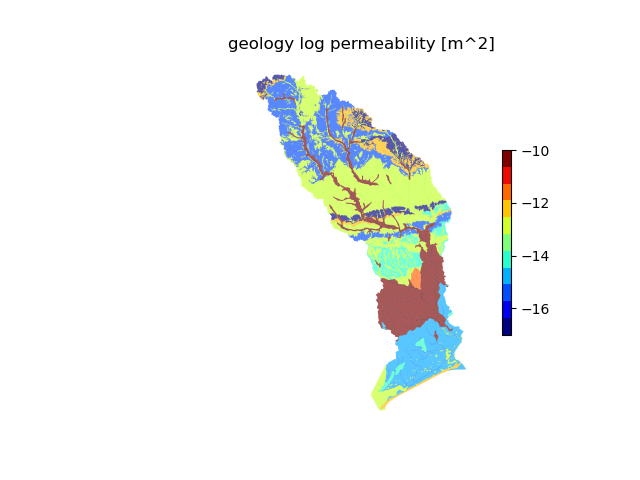

In [44]:
# plot permeability of the underlying geologic layer
iprop = np.empty(geo_color.shape, 'd')

for i in geo_survey_props.index:
    # iprop[geo_color == i] = geo_survey_props.loc[i, 'permeability [m^2]']
    iprop[geo_color == i] = geo_survey_props[geo_survey_props['id']==i]['permeability [m^2]'].values[0]
    
fig, ax = watershed_workflow.plot.get_ax(crs)

pmin_plot = -17
pmax_plot = -10

indices, cmap, norm, ticks, labels = watershed_workflow.colors.generate_indexed_colormap(np.log10(iprop), cmap='jet')
mp = watershed_workflow.plot.mesh(m2, crs, ax=ax,
                        linewidth=0.5, color=np.log10(iprop), cmap=cmap, facecolor='color', vmin=pmin_plot, vmax=pmax_plot)

# mp = watershed_workflow.plot.triangulation(mesh_points3, mesh_tris, crs, ax=ax, 
#                                  color=np.log10(iprop), edgecolor='gray', cmap='jet')
cbar = fig.colorbar(mp, shrink=0.5)
ax.set_title('geology log permeability [m^2]')
ax.axis('off')
plt.show()
fig.savefig(f'../images/{name}_geo_permeability')

kwargs =  {'linewidth': 0.5, 'cmap': <matplotlib.colors.ListedColormap object at 0x3309bfa30>}
setting face color =  [0.22 0.27 0.19 ... 0.05 0.05 0.05]


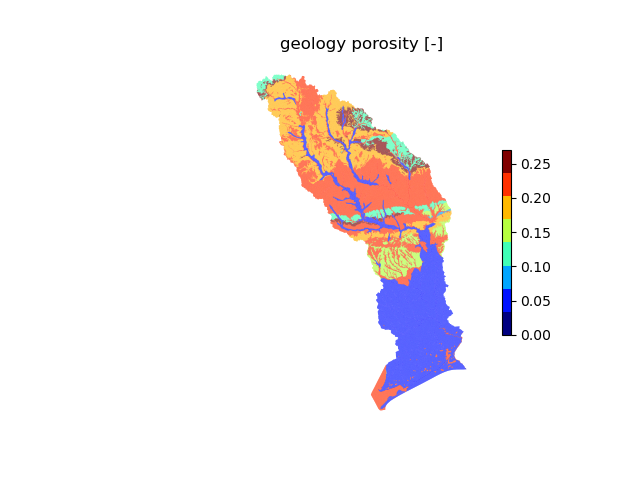

In [45]:
# plot porosity of the geologic layer
iprop = np.empty(geo_color.shape, 'd')
for i in geo_survey_props.index:
    iprop[geo_color == i] = geo_survey_props.loc[i, 'porosity [-]']

fig, ax = watershed_workflow.plot.get_ax(crs)

indices, cmap, norm, ticks, labels = watershed_workflow.colors.generate_indexed_colormap(iprop, cmap='jet')
mp = watershed_workflow.plot.mesh(m2, crs, ax=ax,
                        linewidth=0.5, color=iprop, cmap=cmap, facecolor='color')

# mp = watershed_workflow.plot.triangulation(mesh_points3, mesh_tris, crs, ax=ax, 
#                                  color=iprop, edgecolor='gray', cmap='jet')
cbar = fig.colorbar(mp, shrink=0.5)
ax.set_title('geology porosity [-]')
ax.axis('off')
plt.show()
fig.savefig(f'../images/{name}_geo_porosity')

In [46]:
# note there are clearly some common regions -- no need to duplicate those with identical values.
geo_survey_props_clean = geo_survey_props.copy()
geo_survey_props_clean.pop('logk_stdev [-]')
geo_survey_props_clean.rename(columns={'id':'native_index'}, inplace=True)


def reindex_remove_duplicates(df, index=None):
    """Removes duplicates, creating a new index and saving the old index as tuples of duplicate values. In place!"""
    if index is not None:
        if index in df:
            df.set_index(index, drop=True, inplace=True)
    
    index_name = df.index.name

    # identify duplicate rows
    duplicates = list(df.groupby(list(df)).apply(lambda x: tuple(x.index)))

    # order is preserved
    df.drop_duplicates(inplace=True)
    df.reset_index(inplace=True)
    df[index_name] = duplicates
    return

reindex_remove_duplicates(geo_survey_props_clean, 'native_index')
assert geo_survey_props_clean['porosity [-]'][:].min() >= min_porosity
assert geo_survey_props_clean['permeability [m^2]'][:].max() <= max_permeability
assert geo_survey_props_clean['van Genuchten alpha [Pa^-1]'][:].max() <= max_vg_alpha

geo_survey_props_clean

,native_index,source,permeability [m^2],porosity [-],van Genuchten alpha [Pa^-1],van Genuchten n [-],residual saturation [-]
0,"(600714, 600725, 600729, 600735, 600766, 60077...",GLHYMPS,1.000000e-13,0.22,0.000294,2.0,0.01
1,"(596091, 596103, 596127, 596189, 596197, 63062...",GLHYMPS,6.309573e-16,0.19,0.000025,2.0,0.01
2,"(602066, 1791057)",GLHYMPS,1.000000e-14,0.15,0.000113,2.0,0.01
3,"(602079, 644147, 644151, 1791058)",GLHYMPS,3.162278e-17,0.12,0.000007,2.0,0.01
4,"(596176, 596179, 596185, 596190, 596195, 59620...",GLHYMPS,3.162278e-13,0.27,0.000472,2.0,0.01
5,"(596075, 596080, 596082, 596087, 596088, 59609...",GLHYMPS,3.019952e-11,0.05,0.001000,2.0,0.01
6,"(641942, 641964, 641972, 641973, 641974)",GLHYMPS,1.122018e-15,0.05,0.000065,2.0,0.01
7,"(600806, 600812, 600827, 600828, 600844, 60085...",GLHYMPS,7.413102e-15,0.05,0.000168,2.0,0.01
8,"(1791056,)",GLHYMPS,4.466836e-12,0.05,0.001000,2.0,0.01
9,"(602129, 644230)",GLHYMPS,3.162278e-13,0.09,0.000817,2.0,0.01


/Users/gpq/anaconda3/envs/watershed_workflow-master-2023-04-11/lib/python3.10/site-packages/pyproj/crs/crs.py:1282: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


kwargs =  {'linewidth': 0, 'cmap': <matplotlib.colors.ListedColormap object at 0x330b02770>, 'norm': <matplotlib.colors.BoundaryNorm object at 0x330b027d0>}
setting face color =  [105. 107. 101. ... 102. 102. 102.]


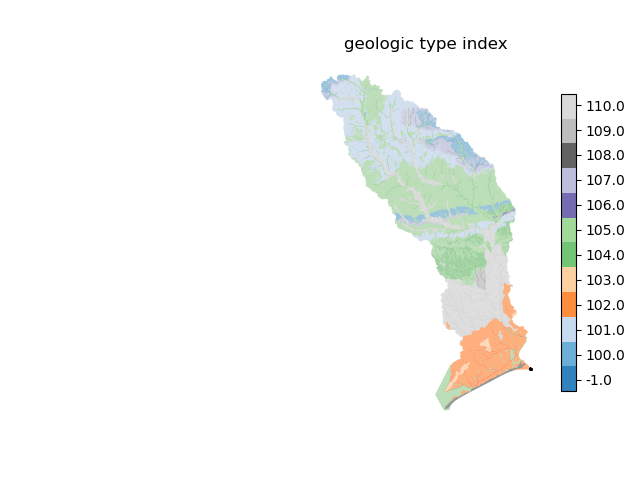

In [47]:
# create a new geologic layer color, keeping on those that are kept here and re-indexing to ATS indices
geo_color_new = -np.ones_like(geo_color)
for new_id, old_id_dups in enumerate(geo_survey_props_clean['native_index']):
    for old_id in old_id_dups:
        geo_color_new[np.where(geo_color == old_id)] = 100+new_id
    
# image the new geo_color
indices, cmap, norm, ticks, labels = watershed_workflow.colors.generate_indexed_colormap(geo_color_new, cmap='tab20c')
fig, ax = watershed_workflow.plot.get_ax(crs)

mp = watershed_workflow.plot.mesh(m2, crs, ax=ax, facecolor='color',
                        linewidth=0, color=geo_color_new, 
                        cmap=cmap, norm=norm)

watershed_workflow.colors.colorbar_index(ncolors=len(np.unique(geo_color_new)), cmap=cmap, labels=labels) 

# show with an x the location where geo_color is -1
pos = np.where(geo_color == -1)
ax.scatter(m2.centroids[pos,0], m2.centroids[pos,1], c='k', marker='x', s=1)

ax.set_title('geologic type index')
ax.axis('off')
plt.show()
fig.savefig(f'../images/{name}_geo_indices')

## Depth-to-bedrock

Depth to bedrock is taken from the [SoilGrids](http://globalchange.bnu.edu.cn/research/dtb.jsp) product.  Here we download a US-based, clipped version of this global product, as file sizes are quite large (all products potentially used total over 100GB).

In [50]:
# set the location of the depth to bedrock dataset. This can be SoilGrids2017 or SoilSedimentaryDeposit (https://daac.ornl.gov/SOILS/guides/Global_Soil_Regolith_Sediment.html)
SOILconfig = 2
sources['depth to bedrock'] = watershed_workflow.source_list.FileManagerRaster('../../../global_data/soil_structure/SoilSedimentaryDeposit/average_soil_and_sedimentary-deposit_thickness.tif')

if SOILconfig == 1:
    DTB_profile, DTB_raster = watershed_workflow.get_raster_on_shape(sources['depth to bedrock'], 
                                                                    watershed.exterior(), crs, nodata=-99999, variable='BDTICM') # note, this argument needed for using the default SoilGrids dataset.
    DTB_raster = DTB_raster/100 #convert from cm to m
elif SOILconfig == 2 or SOILconfig == 3:
    DTB_profile, DTB_raster = watershed_workflow.get_raster_on_shape(sources['depth to bedrock'], 
                                                                    watershed.exterior(), crs) 


# resample the raster to the triangles
# DTB_raster = DTB_raster # units [m]
DTB = watershed_workflow.values_from_raster(m2.centroids, crs, DTB_raster, DTB_profile, algorithm='piecewise bilinear')
DTB_fill = 50 # The nan values are filled with 50 m. This is based on a visual inspection where we found that for Neches the NaN values are water bodies and their neighbors are around 50 m deep.
DTB = np.where(DTB >= 0, DTB, DTB_fill)

2024-04-03 14:51:11,782 - root - INFO: 
2024-04-03 14:51:11,782 - root - INFO: Loading Raster
2024-04-03 14:51:11,783 - root - INFO: ------------------------------
2024-04-03 14:51:11,784 - root - INFO: Collecting raster
2024-04-03 14:51:11,806 - root - INFO: bounds in my_crs: (-95.92569402794433, 29.350478755483884, -93.837693, 32.542455000000004)
2024-04-03 14:51:11,808 - root - INFO: ... got raster of shape: (384, 252)
2024-04-03 14:51:11,808 - root - INFO: ... got raster bounds: (-95.93333333333356, 32.55000000000015, -93.83333333333357, 29.35000000000016)


/Users/gpq/anaconda3/envs/watershed_workflow-master-2023-04-11/lib/python3.10/site-packages/pyproj/crs/crs.py:1282: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)


kwargs =  {'linewidth': 0.1, 'cmap': <matplotlib.colors.ListedColormap object at 0x330974610>, 'edgecolor': 'white'}
setting face color =  [ 1.          1.35763608  1.53417864 ... 50.         50.
 50.        ]


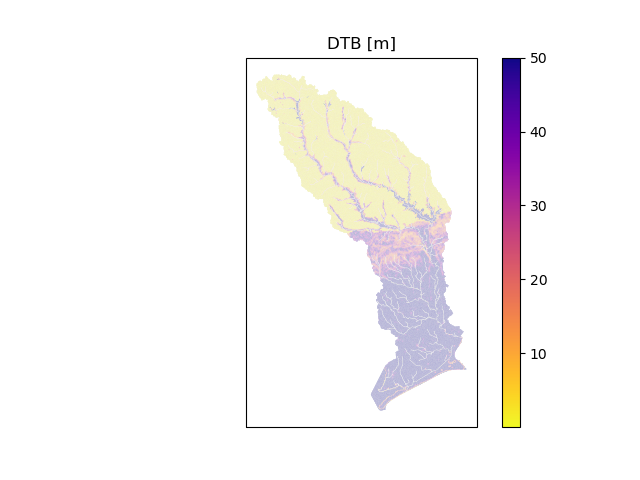

Median depth to bedrock [-] =  27.623733080383193


In [51]:
# plot the resulting surface mesh
fig, ax = watershed_workflow.plot.get_ax(crs)

indices, cmap, norm, ticks, labels = watershed_workflow.colors.generate_indexed_colormap(DTB, cmap='plasma_r')
mp = watershed_workflow.plot.mesh(m2, crs, ax=ax,
                        linewidth=0.1, color=DTB, cmap=cmap, facecolor='color', edgecolor='white')

# mp = watershed_workflow.plot.triangulation(mesh_points3, mesh_tris, crs, ax=ax, 
#                                  color=DTB, cmap='plasma_r', edgecolor='white', linewidth=0.1)
cbar = fig.colorbar(mp)
title = ax.set_title('DTB [m]')
plt.show()
print('Median depth to bedrock [-] = ', np.nanmedian(DTB))
fig.savefig(f'../images/{name}_dtb')

## A combined, complete product?

As a default, we would like a material-driven (e.g. not fields for porosity, perm, etc, but soil classes, each with a common porosity/permeability/vG curve) default that is valid everywhere.  That makes it clear that we must rely on GLHYMPS as the only material-based product that is valid everywhere.  Other products may be layered on top of this, replacing GLHYMPS values, but the underlying layer should be based on GLHYMPS.  To fill in the van Genuchten properties, we relate alpha to permeability and choose a single common n and s_r.


Where available, we then choose to use SSURGO as a layer on top of GLHYMPS.  So start by using all GLHYMPS values, then override ones where SSURGO is valid with those values.  This will be the second model, and has then three layers -- a bedrock layer, a soil layer from 0 to 2m, and a geologic layer, using GLHYMPS values.  SoilGrids depth-to-bedrock will be used to provide the transition between bedrock and (where > 2m) the GLHYMPS "geologic" layer or (where < 2m) the SSURGO "soil" layer.  Where SSURGO has no values, the underlying GLHYMPS values will be used even in the top 2m.

Note, all integer IDs in mesh files must be unique.  This includes Material IDs, side sets, etc.  We create the Material ID map and data frame.  This is used to standardize IDs from multiple data sources.  Traditionally, ATS numbers Material IDs/Side Sets as:

* 0-9 : reserved for boundaries, surface/bottom, etc
* 10-99 : Land Cover side sets, typically NLCD IDs are used
* 100-999 : geologic layer material IDs. 999 is reserved for bedrock.
* 1000-9999 : soil layer material IDs

In [52]:
# map SSURGO mukey to ATS_ID
soil_survey_props_clean['ats_id'] = range(1000, 1000+len(soil_survey_props_clean))
soil_survey_props_clean.set_index('ats_id', inplace=True)

# map GLHYMPS id to ATS_ID
geo_survey_props_clean['ats_id'] = range(100, 100+len(geo_survey_props_clean))
geo_survey_props_clean.set_index('ats_id', inplace=True)

bedrock_props = watershed_workflow.soil_properties.get_bedrock_properties()

# merge the properties databases
subsurface_props = pandas.concat([geo_survey_props_clean,
                                  soil_survey_props_clean,
                                  bedrock_props])

In [53]:
subsurface_props

,native_index,source,permeability [m^2],porosity [-],van Genuchten alpha [Pa^-1],van Genuchten n [-],residual saturation [-],thickness [m]
ats_id,,,,,,,,
100,"(600714, 600725, 600729, 600735, 600766, 60077...",GLHYMPS,1.000000e-13,0.220000,0.000294,2.000000,0.010000,NaN
101,"(596091, 596103, 596127, 596189, 596197, 63062...",GLHYMPS,6.309573e-16,0.190000,0.000025,2.000000,0.010000,NaN
102,"(602066, 1791057)",GLHYMPS,1.000000e-14,0.150000,0.000113,2.000000,0.010000,NaN
103,"(602079, 644147, 644151, 1791058)",GLHYMPS,3.162278e-17,0.120000,0.000007,2.000000,0.010000,NaN
104,"(596176, 596179, 596185, 596190, 596195, 59620...",GLHYMPS,3.162278e-13,0.270000,0.000472,2.000000,0.010000,NaN
...,...,...,...,...,...,...,...,...
2279,3100753,NRCS,3.725695e-13,0.437327,0.000079,1.336146,0.252387,2.03
2280,3220253,NRCS,1.174083e-11,0.420113,0.000357,3.871812,0.133235,2.03
2281,3320966,NRCS,9.100000e-12,0.396749,0.000357,3.719334,0.131273,2.03


2.977771972541987
2.6584471187385796
2.85216408657477
2.851602378995493
3.020944627959687
1.8876576679915855
2.5347480415970596
2.8760035320081303
1.6428263511871617
2.075151130901613
2.660988891246202
1.6785245022565347
1.521912910992094
1.54452073931784
1.521912910992094
3.0726296667990205
2.8098462304300065
2.8098462304300065
1.7479233000339378
1.5549408775930489
1.8244561016114031
1.5117814949671935
1.7451245534230204
1.532617502148807
2.8098462304300074
1.8264573873542023
2.1860576522127744
1.5039489992577337
1.824456101611403
1.6776909146832675
1.824456101611403
2.2567489405649166
3.0967622423187264
3.0683143868359664
1.5501310471442056
1.882959542668305
1.9427537991067103
1.5036123797560088
1.74230051960881
1.50284558749856
1.7103732589532077
1.7064697213421611
1.7064697213421611
1.6800480689190553
1.74230051960881
1.74230051960881
1.74230051960881
1.50284558749856
1.552352787042836
1.7064697213421611
1.50284558749856
1.8453555934894137
3.13918701005775
1.5036123797560088
1.9776

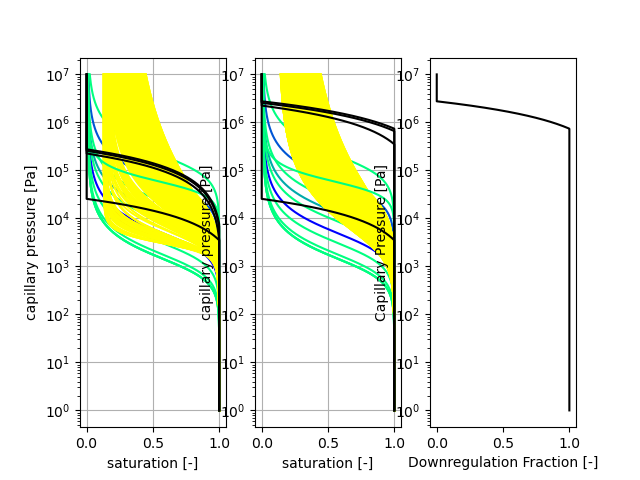

In [54]:
# make a giant plot of all the WRMs (water retention models)

fig = plt.figure()
ax = fig.add_subplot(131)
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)

cm_gl = watershed_workflow.colors.cm_mapper(100, 103, 'winter')
cm_ss = watershed_workflow.colors.cm_mapper(1000,1013, 'autumn')

for i in subsurface_props.index:
    if i <= 999:
        cl = cm_gl(i)
    else:
        cl = cm_ss(i)
    alpha = subsurface_props.loc[i]['van Genuchten alpha [Pa^-1]'] # Related to the inverse of air entry suction
    n = subsurface_props.loc[i]['van Genuchten n [-]'] # Related to pore size distribution
    sr = subsurface_props.loc[i]['residual saturation [-]'] # 
    # Transpiration is the only mechanism to dry out the soil after the witting point. If after that point there is not available water, will be "bad flux error" in ATS v1.3
    # This is a temporary fix to avoid that error.
    if n > 1.5 and i > 999:
        print(n)
        vg = plot_wrm.VanGenuchten(alpha, n, sr)
        plot_wrm.plot(vg, ax, cl)
        n = 1.5
        vg = plot_wrm.VanGenuchten(alpha, n, sr)
        plot_wrm.plot(vg, ax2, cl)
    else:
        vg = plot_wrm.VanGenuchten(alpha, n, sr)
        plot_wrm.plot(vg, ax, cl)
        plot_wrm.plot(vg, ax2, cl)
    
    
# include wilting point limiters
wp1 = plot_wrm.WiltingPointLimiter(7400, 275000) # For "Others".    "mafic potential at fully open stomata [Pa]" and "mafic potential at fully closed stomata [Pa]"
wp2 = plot_wrm.WiltingPointLimiter(6600, 255000) # For "Evergreen Forest"
wp3 = plot_wrm.WiltingPointLimiter(3500, 224000) # For "Shrub/Scrub" and "Deciduous Forest"
wp4 = plot_wrm.WiltingPointLimiter(3500,25500) # Use this value to quikcly fix the "bad flux error" in ATS v1.3. Not recommended since it ignores the actual soil properties.
for wp in [wp1, wp2, wp3, wp4]:
    plot_wrm.plot(wp, ax, 'k')

# include wilting point limiters
wp1 = plot_wrm.WiltingPointLimiter(740000, 2750000) # For "Others".    "mafic potential at fully open stomata [Pa]" and "mafic potential at fully closed stomata [Pa]"
wp2 = plot_wrm.WiltingPointLimiter(660000, 2550000) # For "Evergreen Forest"
wp3 = plot_wrm.WiltingPointLimiter(350000, 2240000) # For "Shrub/Scrub" and "Deciduous Forest"
wp4 = plot_wrm.WiltingPointLimiter(3500,25500) # Use this value to quikcly fix the "bad flux error" in ATS v1.3. Not recommended since it ignores the actual soil properties.
for wp in [wp1, wp2, wp3, wp4]:
    plot_wrm.plot(wp, ax2, 'k')

# Plot the regulation function between open and closed stomata (See Sumendra et al. 2023)
# Create a vector of soil water potential values in log scale
f_phi = np.logspace(0, 7, 1000)

# Set step function
f_open = 740000 # "mafic potential at fully open stomata [Pa]"
f_closed = 2750000 # "mafic potential at fully closed stomata [Pa]"
f_phi_step = np.zeros(len(f_phi))
# f_phi_step = (f_phi - f_open) / (f_closed - f_open)
f_phi_step = (f_phi - f_closed) / (f_open - f_closed)
f_phi_step[f_phi < f_open] = 1
f_phi_step[f_phi > f_closed] = 0

ax3.plot(f_phi_step, f_phi, 'k')
ax3.set_yscale('log')
ax3.set_xlabel('Downregulation Fraction [-]')
ax3.set_ylabel('Capillary Pressure [Pa]')


# show grid
ax.grid(True)
ax2.grid(True)
plt.show()

In [55]:
# Change the residual saturation to avoid the "bad flux" error in ATS v1.3
subsurface_props['van Genuchten n [-]'][(subsurface_props['van Genuchten n [-]']>1.5) & (subsurface_props.index>999)] = 1.5

# save the properties to disk for use in generating input file
outputs['subsurface_properties_filename'] = f'../data-processed/{name}_subsurface_properties.csv'

subsurface_props.to_csv(outputs['subsurface_properties_filename'])

subsurface_props

/var/folders/2f/3qcvb5n94gjgnh1b6hsrwxy09rfxld/T/ipykernel_69723/119207731.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subsurface_props['van Genuchten n [-]'][(subsurface_props['van Genuchten n [-]']>1.5) & (subsurface_props.index>999)] = 1.5


,native_index,source,permeability [m^2],porosity [-],van Genuchten alpha [Pa^-1],van Genuchten n [-],residual saturation [-],thickness [m]
ats_id,,,,,,,,
100,"(600714, 600725, 600729, 600735, 600766, 60077...",GLHYMPS,1.000000e-13,0.220000,0.000294,2.000000,0.010000,NaN
101,"(596091, 596103, 596127, 596189, 596197, 63062...",GLHYMPS,6.309573e-16,0.190000,0.000025,2.000000,0.010000,NaN
102,"(602066, 1791057)",GLHYMPS,1.000000e-14,0.150000,0.000113,2.000000,0.010000,NaN
103,"(602079, 644147, 644151, 1791058)",GLHYMPS,3.162278e-17,0.120000,0.000007,2.000000,0.010000,NaN
104,"(596176, 596179, 596185, 596190, 596195, 59620...",GLHYMPS,3.162278e-13,0.270000,0.000472,2.000000,0.010000,NaN
...,...,...,...,...,...,...,...,...
2279,3100753,NRCS,3.725695e-13,0.437327,0.000079,1.336146,0.252387,2.03
2280,3220253,NRCS,1.174083e-11,0.420113,0.000357,1.500000,0.133235,2.03
2281,3320966,NRCS,9.100000e-12,0.396749,0.000357,1.500000,0.131273,2.03


## Mesh extrusion

Given the surface mesh and material IDs on both the surface and subsurface, we can extrude the surface mesh in the vertical to make a 3D mesh.

The most difficult aspect of extrusion is creating meshes that:
1. aren't huge numbers of cells
2. aren't huge cell thicknesses, especially near the surface
3. follow implied interfaces, e.g. bottom of soil and bottom of geologic layer

This is an iterative process that requires some care and some art.

In [56]:
# here we choose the bottom of the domain to be the maximum of the depth to bedrock.  
# This is really up to the user, but we are hard-coding this for this workflow.
#total_thickness = np.ceil(DTB.max())
# total_thickness = np.nanmean(DTB)
total_thickness = np.ceil(np.nanmax(DTB))

if SOILconfig == 1:
    total_thickness = 20 # [m]

if SOILconfig == 2 or SOILconfig == 3:
    total_thickness = 50 # [m]

print(f'total thickness: {total_thickness} m')
# total_thickness = 50 # [m]

total thickness: 50 m


In [57]:
# Generate a dz structure for the top 2m of soil -- it appears from above that the soil thickness is uniformly 2m
#
# here we try for 10 cells, starting at 5cm at the top and going to 50cm at the bottom of the 2m thick soil
dzs, res = watershed_workflow.mesh.optimize_dzs(0.05, 0.5, 2, 10)
print(dzs)

[0.05896722 0.0808916  0.12653611 0.20885521 0.31139112 0.38601833
 0.39951277 0.42782764]


In [58]:
# a 2m soil thickness and a maximum of 50m depth to bedrock suggests a
# geologic layer of 18 - 1m cells
dzs_soil = [0.05, 0.05, 0.05, 0.12, 0.23, 0.5, 0.5, 0.5]
print(sum(dzs_soil))

if SOILconfig == 1:
    dzs_geo = [1.0, 3.0, 4.0,] + 3*[4.0,]
elif SOILconfig == 2 or SOILconfig == 3:
    dzs_geo = [1.0, 3.0, 4.0,] + 3*[4.0,] + 3*[10.0,]

print(dzs_geo)
print(sum(dzs_geo))

2.0
[1.0, 3.0, 4.0, 4.0, 4.0, 4.0, 10.0, 10.0, 10.0]
50.0


In [59]:
# layer extrusion
# -- data structures needed for extrusion
layer_types = []
layer_data = []
layer_ncells = []
layer_mat_ids = []

# -- soil layer --
depth = 0


if SOILconfig == 1 or SOILconfig == 3:
    for dz in dzs_soil:
        depth += 0.5 * dz
        layer_types.append('constant')
        layer_data.append(dz)
        layer_ncells.append(1)
        
        br_or_geo = np.where(depth < DTB, geo_color_new, 999)
        soil_or_br_or_geo = np.where(np.bitwise_and(soil_color_new > 0, depth < soil_thickness),
                                    soil_color_new,
                                    br_or_geo)
        
        layer_mat_ids.append(soil_or_br_or_geo)
        depth += 0.5 * dz
        
    # -- geologic layer --
    for dz in dzs_geo:
        depth += 0.5 * dz
        layer_types.append('constant')
        layer_data.append(dz)
        layer_ncells.append(1)
        layer_mat_ids.append(np.where(depth < DTB, geo_color_new, 999))
        depth += 0.5 * dz

elif SOILconfig == 2:
    for dz in dzs_soil:
        depth += 0.5 * dz
        layer_types.append('constant')
        layer_data.append(dz)
        layer_ncells.append(1)
        
        br_or_geo = np.where(depth < DTB, geo_color_new, 999)
        soil_or_br_or_geo = np.where(np.bitwise_and(soil_color_new > 0, depth < DTB),
                                    soil_color_new,
                                    br_or_geo)
        
        layer_mat_ids.append(soil_or_br_or_geo)
        depth += 0.5 * dz
        
    # -- geologic layer --
    for dz in dzs_geo:
        depth += 0.5 * dz
        layer_types.append('constant')
        layer_data.append(dz)
        layer_ncells.append(1)

        br_or_geo = np.where(depth < DTB, geo_color_new, 999)
        soil_or_br_or_geo = np.where(np.bitwise_and(soil_color_new > 0, depth < DTB),
                                    soil_color_new,
                                    br_or_geo)

        layer_mat_ids.append(soil_or_br_or_geo)
        depth += 0.5 * dz


# print the summary
watershed_workflow.mesh.Mesh3D.summarize_extrusion(layer_types, layer_data, 
                                            layer_ncells, layer_mat_ids)


2024-04-03 14:56:32,317 - root - INFO: Cell summary:
2024-04-03 14:56:32,317 - root - INFO: ------------------------------------------------------------
2024-04-03 14:56:32,318 - root - INFO: l_id	| c_id	|mat_id	| dz		| z_top
2024-04-03 14:56:32,318 - root - INFO: ------------------------------------------------------------
2024-04-03 14:56:32,318 - root - INFO:  00 	| 00 	| 2709 	|   0.050000 	|   0.000000
2024-04-03 14:56:32,318 - root - INFO:  01 	| 01 	| 2709 	|   0.050000 	|   0.050000
2024-04-03 14:56:32,318 - root - INFO:  02 	| 02 	| 2709 	|   0.050000 	|   0.100000
2024-04-03 14:56:32,319 - root - INFO:  03 	| 03 	| 2709 	|   0.120000 	|   0.150000
2024-04-03 14:56:32,319 - root - INFO:  04 	| 04 	| 2709 	|   0.230000 	|   0.270000
2024-04-03 14:56:32,319 - root - INFO:  05 	| 05 	| 2709 	|   0.500000 	|   0.500000
2024-04-03 14:56:32,319 - root - INFO:  06 	| 06 	|  999 	|   0.500000 	|   1.000000
2024-04-03 14:56:32,320 - root - INFO:  07 	| 07 	|  999 	|   0.500000 	|   1.5

In [60]:
# extrude
m3 = watershed_workflow.mesh.Mesh3D.extruded_Mesh2D(m2, layer_types, layer_data, 
                                             layer_ncells, layer_mat_ids)

In [73]:
# add back on land cover side sets ()
surf_ss = m3.side_sets[1]

for index, nlcd_name in zip(nlcd_indices, nlcd_labels):
    where = np.where(lc_channels == index)[0]
    # where = np.where(nlcd_color_new == index)[0]
    print(index, nlcd_name, len(where))
    ss = watershed_workflow.mesh.SideSet(nlcd_name, int(index), 
                            [surf_ss.cell_list[w] for w in where],
                            [surf_ss.side_list[w] for w in where])        
    m3.side_sets.append(ss)

11 Open Water 44483
21 Developed, Open Space 17703
22 Developed, Low Intensity 13924
23 Developed, Medium Intensity 5965
24 Developed, High Intensity 2475
31 Barren Land 892
41 Deciduous Forest 7113
42 Evergreen Forest 138291
43 Mixed Forest 56735
52 Shrub/Scrub 21950
60 Open Channel 1 1461
61 Open Channel 2 5903
62 Open Channel 3 5799
63 Open Channel 4 3158
64 Open Channel 5 3699
65 Open Channel 6 971
71 Grassland/Herbaceous 25614
81 Pasture/Hay 107324
82 Cultivated Crops 6649
90 Woody Wetlands 171799
95 Emergent Herbaceous Wetlands 35433


In [75]:
print('2D labeled sets')
print('---------------')
for ls in m2.labeled_sets:
    print(f'{ls.setid} : {ls.entity} : {len(ls.ent_ids)} : "{ls.name}"')

print('')
print('Extruded 3D labeled sets')
print('------------------------')
for ls in m3.labeled_sets:
    print(f'{ls.setid} : {ls.entity} : {len(ls.ent_ids)} : "{ls.name}"')

print('')
print('Extruded 3D side sets')
print('---------------------')
for ls in m3.side_sets:
    print(f'{ls.setid} : FACE : {len(ls.cell_list)} : "{ls.name}"')

2D labeled sets
---------------
10000 : CELL : 971 : "reaches of StreamOrder 6 in river 0 surface"
10001 : CELL : 2773 : "reaches of StreamOrder 4 in river 0 surface"
10002 : CELL : 5616 : "reaches of StreamOrder 3 in river 0 surface"
10003 : CELL : 4952 : "reaches of StreamOrder 2 in river 0 surface"
10004 : CELL : 823 : "reaches of StreamOrder 1 in river 0 surface"
10005 : CELL : 3354 : "reaches of StreamOrder 5 in river 0 surface"
10006 : CELL : 345 : "reaches of StreamOrder 5 in river 1 surface"
10007 : CELL : 951 : "reaches of StreamOrder 2 in river 1 surface"
10008 : CELL : 638 : "reaches of StreamOrder 1 in river 1 surface"
10009 : CELL : 385 : "reaches of StreamOrder 4 in river 1 surface"
10010 : CELL : 183 : "reaches of StreamOrder 3 in river 1 surface"
10011 : CELL : 12674 : "Neches River"
10012 : CELL : 12674 : "Neches River surface"
10013 : CELL : 66855 : "Neches Rv Saltwater Barrier at Beaumont, TX"
10014 : CELL : 66855 : "Neches Rv Saltwater Barrier at Beaumont, TX surfac

In [76]:
# save to disk. Here!
outputs['mesh_filename'] = f'../data-processed/{name}.exo'
try:
    os.remove(outputs['mesh_filename'])
except FileNotFoundError:
    pass
m3.write_exodus(outputs['mesh_filename'])


You are using exodus.py v 1.21.2 (seacas-py3), a python wrapper of some of the exodus library.

Copyright (c) 2013-2023 National Technology &
Engineering Solutions of Sandia, LLC (NTESS).  Under the terms of
Contract DE-NA0003525 with NTESS, the U.S. Government retains certain
rights in this software.

Opening exodus file: ../data-processed/neches.exo


2024-04-03 15:36:26,508 - root - INFO: adding side set: 1
2024-04-03 15:36:30,790 - root - INFO: adding side set: 2
2024-04-03 15:36:35,317 - root - INFO: adding side set: 3
2024-04-03 15:36:35,999 - root - INFO: adding side set: 10000
2024-04-03 15:36:36,454 - root - INFO: adding side set: 10001
2024-04-03 15:36:36,933 - root - INFO: adding side set: 10002
2024-04-03 15:36:37,410 - root - INFO: adding side set: 10003
2024-04-03 15:36:37,850 - root - INFO: adding side set: 10004
2024-04-03 15:36:38,308 - root - INFO: adding side set: 10005
2024-04-03 15:36:38,786 - root - INFO: adding side set: 10006
2024-04-03 15:36:39,276 - root - INFO: adding side set: 10007
2024-04-03 15:36:39,718 - root - INFO: adding side set: 10008
2024-04-03 15:36:40,154 - root - INFO: adding side set: 10009
2024-04-03 15:36:40,584 - root - INFO: adding side set: 10010
2024-04-03 15:36:41,014 - root - INFO: adding side set: 10012
2024-04-03 15:36:41,502 - root - INFO: adding side set: 10014
2024-04-03 15:36:42,

Closing exodus file: ../data-processed/neches.exo


## Collect the DayMet raster covering this area

Note that here we need two files -- the actual data and the typical year data.

The first cell downloads the raw data and generates the actual data file used by ATS, the second cell averages days, smooths the data, and writes a typical year.

In [77]:

# The ats rainfall input data is heavy, and cannot be saved in github. This is saved in the folder global_data

# # This is done with branch v1.3 (See get_Daymet_neches.ipynb)

outputs['daymet_filename'] = f'../../../global_data/rainfall_input_ATS/{name}/{name}_DayMet_2010_2020.h5'
outputs['daymet_spinup_filename'] = f'../../../global_data/rainfall_input_ATS/{name}/{name}_DayMet_typical_1980_2020.h5'


## Generate files for Leaf Area Index

In addition to meteorological forcing data, we need land cover leaf area index data.  Typically this can be smoother than the DayMet, and our default source for this, MODIS, is not currently automated.  Therefore this assumes you have already acquired the raw MODIS data (note -- get Pin to add his scripts for this!)

MODIS is available from 2002 to present -- we generate a typical year and can use that for all years, though probably we should do something smarter if possible.

In [212]:
def plot(df, form, axs):
    cm = watershed_workflow.colors.enumerated_colors(15)
    i = 0
    for k in df.keys():
        if not k.startswith('time'):
            axs[i].plot(df['time [d]'], df[k], form, color=cm[i])
            axs[i].set_ylabel('LAI [-]')
            axs[i].set_title(k)
            i += 1

In [213]:
# load the raw MODIS data and covert it to pandas
# This file is obtained from get_MODIS_LAI_neches.ipynb
# if modis_name is None:
#     modis_name = name
    
raw_modis_filename = f'../data-processed/{name}_MODIS_LAI_072002_122020.h5'

d = h5py.File(raw_modis_filename,'r')
df = pandas.DataFrame()
for k in d.keys():
    df[k] = d[k][:]

#df['time [d]'] = df['time [s]']/86400
df['time [d]'] = df['time [s]']/86400 + 8214

In [214]:
# interpolate this time series into a daily time series
ts = np.arange(8214, 14969, 1)

df_interp = pandas.DataFrame()
df_interp['time [d]'] = ts

for k in df.keys():
    if k != 'time [s]':
        f = scipy.interpolate.interp1d(df['time [d]'][:], df[k][:])
        df_interp[k] = f(ts)

df = df_interp

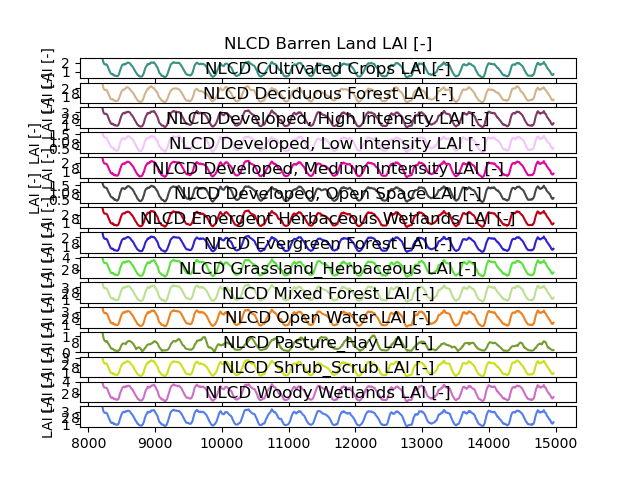

In [215]:
# smooth the data
df_smooth = pandas.DataFrame()
df_smooth['time [d]'] = df['time [d]']
for k in df.keys():
    if k != 'time [d]':
        df_smooth[k] = scipy.signal.savgol_filter(df[k], 101, 3)

        
# plot comparison
fig = plt.figure()
axs = fig.subplots(15,1)
#plot(df, '-', axs)
plot(df_smooth, '-', axs)
plt.show()

In [216]:
# add time back and write to disk
outputs['modis_filename'] = f'../data-processed/{name}_MODIS_LAI_smoothed_2002_2020.h5'

df_smooth['time [s]'] = df_smooth['time [d]']*86400
with h5py.File(outputs['modis_filename'],'w') as fid:
    for k in df_smooth:
        fid.create_dataset(k, data=df_smooth[k][:])

In [217]:
df = df_smooth

# split into n_years dataframes, one per year
df_yr = []
for year in range(23, 39):
    yr = df.loc[df_interp['time [d]'] >= year*365]
    df_yr.append(yr.loc[yr['time [d]'] < (year+1)*365])

# average across the years
df_avg = pandas.DataFrame()
for yr in df_yr:
    for k in yr.keys():
        if not k.startswith('time'):
            if k in df_avg:
                df_avg[k] = df_avg[k].array + yr[k].array
            else:
                df_avg[k] = yr[k].copy()

for k in df_avg.keys():
    df_avg[k] = df_avg[k][:] / len(df_yr)

df_avg['time [d]'] = df['time [d]']


In [218]:
# replicate 40 times to make 40 years (remem)
# tile all data to repeat n_year times
df_rep = pandas.DataFrame()
for key in df_avg:
    if not key.startswith('time'):
        df_rep[key] = np.tile(df_avg[key].array, 40)
        assert(len(df_rep) == 40*365)
    
# time is simply daily data
df_rep['time [s]'] = 86400. * np.arange(0., 40 * 365., 1.)
df_rep['time [d]'] = np.arange(0., 40 * 365., 1.)

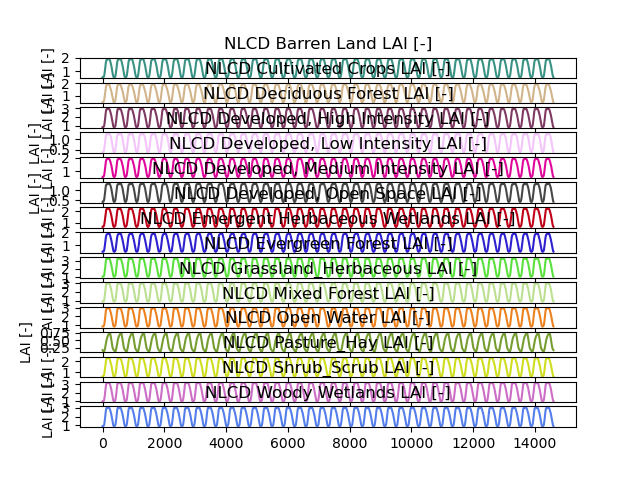

In [219]:
# plot this and make sure it looks right
fig = plt.figure()
axs = fig.subplots(15,1)
plot(df_rep, '-', axs)
plt.show()

In [220]:
# write to disk
outputs['modis_typical_filename'] = f'../data-processed/{name}_MODIS_LAI_typical_1980_2020.h5'

with h5py.File(outputs['modis_typical_filename'],'w') as fid:
    for k in df_rep:
        fid.create_dataset(k, data=df_rep[k][:])

## Write ATS input files

We now generate three input files -- two for spinup (steadystate solution and cyclic steadystate solution) and one for transient runs.

Steadystate has its own physics, but cyclic steadystate and transient share a common set of physics.  Each have their own met data strategy.

The first step is to generate the sections of xml that will replace parts of the template files.  This is done prior to loading any templates to make clear that these are totally generated from scratch using the ats_input_spec tool.

Note that throughout, we will assume an additional level of folder nesting, e.g. runs will be completed in '../spinup-CoalCreek/run0', meaning that we have to append an extra '../' to the start of all filenames.  This makes it easier to deal with mistakes, continued runs, etc.

In [226]:
# get an ATS "main" input spec list -- note, this is a dummy and is not used to write any files yet
main_list = ats_input_spec.public.get_main()


In [227]:
# Load manning values that was saved in NLCD_Manning_labels.to_csv(f'../data-processed/{name}_NLCD_Manning.csv')

NLCD_Manning_values = pandas.read_csv(f'../data-processed/{name}_NLCD_Manning.csv')
# Set the index as the first column 
NLCD_Manning_values.set_index(NLCD_Manning_values.columns[0], inplace=True)


In [228]:
# add the subsurface and surface domains
#
# Note this also adds a "computational domain" region to the region list, and a vis spec 
# for "domain"
mesh_filename = os.path.join('..', outputs['mesh_filename'])

ats_input_spec.public.add_domain(main_list, 
                                 domain_name='domain', 
                                 dimension=3, 
                                 mesh_type='read mesh file', 
                                 mesh_args={'file':mesh_filename})
main_list['mesh']['domain']['build columns from set'] = 'surface'

# Note this also adds a "surface domain" region to the region list and a vis spec for 
# "surface"
ats_input_spec.public.add_domain(main_list,
                                domain_name='surface',
                                dimension=2,
                                mesh_type='surface',
                                mesh_args={'surface sideset name':'surface'})

# Add the snow and canopy domains, which are aliases to the surface
ats_input_spec.public.add_domain(main_list,
                                domain_name='snow',
                                dimension=2,
                                mesh_type='aliased',
                                mesh_args={'target':'surface'})
ats_input_spec.public.add_domain(main_list,
                                domain_name='canopy',
                                dimension=2,
                                mesh_type='aliased',
                                mesh_args={'target':'surface'})

# add the "surface boundary" list
ats_input_spec.public.add_region(main_list,
                                region_name='surface boundary',
                                region_type='boundary',
                                region_args={'entity': 'FACE'})

def add_labeled_set(ls_name, label, entity_kind):
    """Helper function to add labeled sets to the main list"""
    ats_input_spec.public.add_region(main_list,
                                    region_name=ls_name,
                                    region_type='labeled set',
                                    region_args={'label' : str(label), 
                                                 'file' : mesh_filename,
                                                 'format' : 'Exodus II',
                                                 'entity' : entity_kind})

# add the bottom and surface sets
add_labeled_set('bottom_face', 1, 'FACE')
add_labeled_set('surface', 2, 'FACE')

# add the NLCD labeled sets
for index, nlcd_name in zip(nlcd_indices, nlcd_labels):
    add_labeled_set(nlcd_name, index, 'FACE')

# add soil sets: note we need a way to name the set, so we use, e.g. SSURGO-MUKEY.
def soil_set_name(ats_id):
    if ats_id == 999:
        return 'bedrock'
    source = subsurface_props.loc[ats_id]['source']
    native_id = subsurface_props.loc[ats_id]['native_index']
    if type(native_id) in [tuple,list]:
        native_id = native_id[0]
    return f"{source}-{native_id}"

for ats_id in subsurface_props.index:
    set_name = soil_set_name(ats_id)
    add_labeled_set(set_name, ats_id, 'CELL')

print(main_list)

cycle driver [coordinator-spec] : [incomplete]
  ONE OF:
    end time [double] : None
    end time units [string] : "s"
  OR:
    end cycle [int] : [optional]
  start time [double] : 0.00000000
  start time units [string] : "s"
  subcycled timestep [bool] : false
  restart from checkpoint file [string] : [optional]
  wallclock duration [hrs] [double] : [optional]
  required times [io-event-spec] : [optional]
    cycles start period stop [Array(int)] : [optional]
    cycles start period stop 0 [Array(int)] : [optional]
    cycles [Array(int)] : [optional]
    times start period stop [Array(double)] : [optional]
    times start period stop units [string] : s
    times start period stop 0 [Array(double)] : [optional]
    times start period stop 0 units [string] : s
    times [Array(double)] : [optional]
    times units [string] : s
  PK tree [pk-typed-spec-list] : [incomplete]
    
mesh [mesh-typed-spec-list] : [complete]
  domain [TypedCollection] : [complete]
    mesh type [string] : re

In [229]:
# next write a land-cover section for each NLCD type
land_cover_list = ats_input_spec.public.known_specs['land-cover-spec-list']
main_list['state']['initial conditions']['land cover types'] = land_cover_list

def add_land_cover_default(main, lc_name):
    """Adds a default land-cover type to the spec."""
    lc = main['state']['initial conditions']['land cover types'].append_empty(lc_name)
    # print(lc)
    # set some basic defaults
    lc['Priestley-Taylor alpha of snow [-]'] = 1.26
    lc['Priestley-Taylor alpha of bare ground [-]'] = 1.26
    lc['Priestley-Taylor alpha of canopy [-]'] = 1.26
    lc['Priestley-Taylor alpha of transpiration [-]'] = 1.26

    lc['albedo of bare ground [-]'] = 0.4
    lc['emissivity of bare ground [-]'] = 0.98
    lc['albedo of canopy [-]'] = 0.11
    # lc['emissivity of canopy [-]'] = 0.95
    
    lc["Beer's law extinction coefficient, shortwave [-]"] = 0.6
    lc["Beer's law extinction coefficient, longwave [-]"] = 5
    
    lc["snow transition depth [m]"] = 0.02
    lc["dessicated zone thickness [m]"] = 0.005 # Based on https://agupubs.onlinelibrary.wiley.com/doi/full/10.1029/2008JD010834
    lc["Clapp and Hornberger b [-]"] = 3 # Based on the median value obatined in the b histogram using code vg2bc_example.ipynb
    
    # defaults for grass/no vei
    lc['rooting depth max [m]'] = 5.
    lc['rooting profile alpha [-]'] = 11.0
    lc['rooting profile beta [-]'] = 2.0
    
    
    # Note, the mafic potential values are likely pretty bad for the types of van Genuchten 
    # curves we are using (https://www.sciencedirect.com/science/article/pii/S0168192314000483).
    # Likely they need to be modified.  Note that these values are in [mm] from CLM TN 4.5 table 8.1, so the 
    # factor of 10 converts to [Pa].

    lc['mafic potential at fully closed stomata [Pa]'] = 2750000.
    lc['mafic potential at fully open stomata [Pa]'] = 740000
    
    # by default we let the LAI take care of this rather than turn off deciduous 
    # transpiration manually the way that PRMS does it. 
    lc['leaf on time [doy]'] = -1
    lc['leaf off time [doy]'] = -1
    return lc

# add default lists for all types
for index, nlcd_name in zip(nlcd_indices, nlcd_labels):
    # print(index, nlcd_name)
    lc = add_land_cover_default(main_list, nlcd_name)

# update some defaults
# ['Other', 'Deciduous Forest', 'Evergreen Forest', 'Shrub/Scrub']
# note, these are from the CLM Technical Note v4.5
#
# Rooting depth curves from CLM TN 4.5 table 8.3
#
# Note, the mafic potential values are likely pretty bad for the types of van Genuchten 
# curves we are using (ETC -- add paper citation about this topic).  Likely they need
# to be modified.  Note that these values are in [mm] from CLM TN 4.5 table 8.1, so the 
# factor of 10 converts to [Pa]
#
# Note, albedo of canopy taken from CLM TN 4.5 table 3.1
land_cover_list['Evergreen Forest']['rooting profile alpha [-]'] = 7.0
land_cover_list['Evergreen Forest']['rooting profile beta [-]'] = 2.0
land_cover_list['Evergreen Forest']['rooting depth max [m]'] = 10.0
land_cover_list['Evergreen Forest']['mafic potential at fully closed stomata [Pa]'] = 2550000
land_cover_list['Evergreen Forest']['mafic potential at fully open stomata [Pa]'] = 660000
land_cover_list['Evergreen Forest']['albedo of canopy [-]'] = 0.07

land_cover_list['Deciduous Forest']['rooting profile alpha [-]'] = 6.0
land_cover_list['Deciduous Forest']['rooting profile beta [-]'] = 2.0
land_cover_list['Deciduous Forest']['rooting depth max [m]'] = 10.0
land_cover_list['Deciduous Forest']['mafic potential at fully closed stomata [Pa]'] = 2240000
land_cover_list['Deciduous Forest']['mafic potential at fully open stomata [Pa]'] = 350000
land_cover_list['Deciduous Forest']['albedo of canopy [-]'] = 0.1


In [230]:
# finally, we write soil property specs for porosity, permeability, and WRMs
poro_eval = main_list['state']['evaluators'].append_empty('base_porosity')
# poro_eval = main_list['state']['field evaluators'].append_empty('base_porosity')
poro_eval.set_type('independent variable', ats_input_spec.public.known_specs['independent-variable-function-evaluator-spec'])
# poro_eval.set_type('independent variable', ats_input_spec.public.known_specs['independent-variable-evaluator-spec'])
poro_eval['constant in time'] = True

perm_eval = main_list['state']['evaluators'].append_empty('permeability')
# perm_eval = main_list['state']['field evaluators'].append_empty('permeability')
perm_eval.set_type('independent variable', ats_input_spec.public.known_specs['independent-variable-function-evaluator-spec'])
# perm_eval.set_type('independent variable', ats_input_spec.public.known_specs['independent-variable-evaluator-spec'])
perm_eval['constant in time'] = True

wrm_eval = main_list['state']['evaluators'].append_empty('saturation_liquid')
# wrm_eval = main_list['state']['field evaluators'].append_empty('saturation_liquid')
wrm_eval.set_type('WRM rel perm', ats_input_spec.public.known_specs['rel-perm-evaluator-spec'])
wrm_eval['boundary rel perm strategy'] = 'surface rel perm'
wrm_eval['permeability rescaling'] = 1e7

# Add mannings n for each land cover type
manning_eval = main_list['state']['evaluators'].append_empty('surface-manning_coefficient')
# manning_eval = main_list['state']['field evaluators'].append_empty('surface-manning_coefficient')
manning_eval.set_type('independent variable constant', ats_input_spec.public.known_specs['independent-variable-function-evaluator-spec'])
manning_eval['constant in time'] = True

print(main_list['state']['evaluators'])
# print(main_list['state']['field evaluators'])

base_porosity [TypedCollection] : [incomplete]
  evaluator type [string] : independent variable
  constant in time [bool] : true
  function [composite-vector-function-spec-list] : [incomplete]
    
permeability [TypedCollection] : [incomplete]
  evaluator type [string] : independent variable
  constant in time [bool] : true
  function [composite-vector-function-spec-list] : [incomplete]
    
saturation_liquid [TypedCollection] : [incomplete]
  evaluator type [string] : WRM rel perm
  use density on viscosity in rel perm [bool] : true
  boundary rel perm strategy [string] : surface rel perm
  minimum rel perm cutoff [double] : 0.00000000
  permeability rescaling [double] : 10000000.00000000
  WRM parameters [wrm-typedinline-spec-list] : [incomplete]
    
surface-manning_coefficient [TypedCollection] : [incomplete]
  evaluator type [string] : independent variable constant
  constant in time [bool] : true
  function [composite-vector-function-spec-list] : [incomplete]
    


In [231]:
def add_region_set_value(evaluator, ats_id, val):
    region = soil_set_name(ats_id)
    my_func = evaluator['function'].append_empty(region)
    my_func['region'] = region
    my_func['component'] = 'cell'
    my_func_const = my_func['function'].set_type('constant', 
                                                 ats_input_spec.public.known_specs['function-constant-spec'])
    my_func_const['value'] = float(val)

def add_wrm(evaluator, ats_id, props):
    region = soil_set_name(ats_id)
    wrm = wrm_eval['WRM parameters'].append_empty(region)
    wrm.set_type('van Genuchten', ats_input_spec.public.known_specs['WRM-van-Genuchten-spec'])

    wrm['region'] = region
    wrm['van Genuchten alpha [Pa^-1]'] = float(props['van Genuchten alpha [Pa^-1]'])
    wrm['van Genuchten n [-]'] = float(props['van Genuchten n [-]'])
    wrm['residual saturation [-]'] = float(props['residual saturation [-]'])
    if wrm['van Genuchten n [-]'] < 1.5:
        wrm['smoothing interval width [saturation]'] = 0.01
    else:
        wrm['smoothing interval width [saturation]'] = 0.0
    
for ats_id in subsurface_props.index:
    add_region_set_value(poro_eval, ats_id, subsurface_props.loc[ats_id]['porosity [-]'])
    add_region_set_value(perm_eval, ats_id, subsurface_props.loc[ats_id]['permeability [m^2]'])
    add_wrm(wrm_eval, ats_id, subsurface_props.loc[ats_id])

# Add mannings n for each soil type
def add_region_set_value_manning(evaluator, region, val):
    my_func = evaluator['function'].append_empty(region)
    my_func['region'] = region
    my_func['component'] = 'cell'
    my_func_const = my_func['function'].set_type('constant', 
                                                 ats_input_spec.public.known_specs['function-constant-spec'])
    my_func_const['value'] = float(val)

for region in nlcd_labels:
    add_region_set_value_manning(manning_eval, region, NLCD_Manning_values.loc[region]['Manning value'])

print(main_list['state']['evaluators'])
# print(main_list['state']['field evaluators'])

base_porosity [TypedCollection] : [complete]
  evaluator type [string] : independent variable
  constant in time [bool] : true
  function [composite-vector-function-spec-list] : [complete]
    GLHYMPS-600714 [TypedCollection] : [complete]
      region [string] : GLHYMPS-600714
      component [string] : cell
      function [function-typedinline-spec] : [complete]
        function type [string] : constant
        value [double] : 0.22000000
    GLHYMPS-596091 [TypedCollection] : [complete]
      region [string] : GLHYMPS-596091
      component [string] : cell
      function [function-typedinline-spec] : [complete]
        function type [string] : constant
        value [double] : 0.19000000
    GLHYMPS-602066 [TypedCollection] : [complete]
      region [string] : GLHYMPS-602066
      component [string] : cell
      function [function-typedinline-spec] : [complete]
        function type [string] : constant
        value [double] : 0.15000000
    GLHYMPS-602079 [TypedCollection] : [comple

In [232]:
# Add observations to the main list
# add observations for each subcatchment for transient runs
ats_input_spec.public.add_observations_water_balance(main_list, "computational domain", 
                                                        "surface domain","external_sides")

for poly in watershed.polygons():
    region = poly.properties['name']
    ats_input_spec.public.add_observations_water_balance(main_list, region, outlet_region=region+' outlet')

In [233]:
outputs['generated_ats'] = f'../data-processed/{name}_generated_ats.xml'
ats_input_spec.io.write(main_list, outputs['generated_ats'])
main_xml = ats_input_spec.io.to_xml(main_list)

/Users/gpq/ORNL/Projects/SETx_Urban/ATS_Implementation/ats_input_spec/ats_input_spec/io.py:43: UserWarning: Creating an incomplete XML object, missing entries!
  warnings.warn('Creating an incomplete XML object, missing entries!')


In [234]:
# Use {name}_generated_ats.xml to mannually create the templates xml files for the steady state, cyclic, and transient xml files.
# For this, the name="canopy-leaf_area_index"  (LAI) need to be set manually for each land cover type.


#Example:
# <ParameterList name="canopy-leaf_area_index" type="ParameterList">
#         <Parameter name="field evaluator type" type="string" value="independent variable" />
#         <ParameterList name="function" type="ParameterList">
#           <ParameterList name="Evergreen Forest" type="ParameterList">
#             <Parameter name="region" type="string" value="Evergreen Forest" />
#             <Parameter name="component" type="string" value="cell" />
#             <ParameterList name="function" type="ParameterList">
#               <ParameterList name="function-tabular" type="ParameterList">
#                 <Parameter name="file" type="string" value="../../data-processed/neches_MODIS_LAI_typical_1980_2020.h5" />
#                 <Parameter name="x header" type="string" value="time [s]" />
#                 <Parameter name="y header" type="string" value="NLCD Evergreen forest LAI [-]" />
#               </ParameterList>
#             </ParameterList>
#           </ParameterList>

In [235]:
def populate_basic_properties(xml, homogeneous_wrm=False, homogeneous_poro=False, homogeneous_perm=False, homogeneous_manning=False):
    """This function updates an xml object with the above properties for mesh, regions, soil props, and lc props"""
    # find and replace the mesh list
    mesh_i = next(i for (i,el) in enumerate(xml) if el.get('name') == 'mesh')
    xml[mesh_i] = asearch.child_by_name(main_xml, 'mesh')

    # find and replace the regions list
    region_i = next(i for (i,el) in enumerate(xml) if el.get('name') == 'regions')
    xml[region_i] = asearch.child_by_name(main_xml, 'regions')

    # find and replace the WRMs list -- note here we only replace the inner "WRM parameters" because the
    # demo has this in the PK, not in the field evaluators list
    if not homogeneous_wrm:
        wrm_list = asearch.find_path(xml, ['PKs', 'water retention evaluator'])
        wrm_i = next(i for (i,el) in enumerate(wrm_list) if el.get('name') == 'WRM parameters')
        wrm_list[wrm_i] = asearch.find_path(main_xml, ['state','evaluators','WRM parameters'])
        # wrm_list[wrm_i] = asearch.find_path(main_xml, ['state','field evaluators','WRM parameters'])

    fe_list = asearch.find_path(xml, ['state', 'evaluators'])
    # fe_list = asearch.find_path(xml, ['state', 'field evaluators'])

    # find and replace porosity, permeability
    if not homogeneous_poro:
        poro_i = next(i for (i,el) in enumerate(fe_list) if el.get('name') == 'base_porosity')
        fe_list[poro_i] = asearch.find_path(main_xml, ['state', 'evaluators', 'base_porosity'])
        # fe_list[poro_i] = asearch.find_path(main_xml, ['state', 'field evaluators', 'base_porosity'])

    if not homogeneous_perm:
        perm_i = next(i for (i,el) in enumerate(fe_list) if el.get('name') == 'permeability')
        fe_list[perm_i] = asearch.find_path(main_xml, ['state', 'evaluators', 'permeability'])
        # fe_list[perm_i] = asearch.find_path(main_xml, ['state', 'field evaluators', 'permeability'])

    if not homogeneous_manning:
        mann_i = next(i for (i,el) in enumerate(fe_list) if el.get('name') == 'surface-manning_coefficient')
        fe_list[mann_i] = asearch.find_path(main_xml, ['state', 'evaluators', 'surface-manning_coefficient'])
        # fe_list[mann_i] = asearch.find_path(main_xml, ['state', 'field evaluators', 'surface-manning_coefficient'])

    # find and replace land cover
    consts_list = asearch.find_path(xml, ['state', 'initial conditions'])
    try:
        lc_i = next(i for (i,el) in enumerate(consts_list) if el.get('name') == 'land cover types')
    except StopIteration:
        pass
    else:
        consts_list[lc_i] = asearch.find_path(main_xml, ['state', 'initial conditions', 'land cover types'])

def create_unique_name(name, homogeneous_wrm=False, homogeneous_poro=False, homogeneous_perm=False, homogeneous_manning=False):
    suffix = '_h'
    if homogeneous_manning:
        suffix += 'm'
    if homogeneous_perm:
        suffix += 'K'
    if homogeneous_poro:
        suffix += 'p'
    if homogeneous_wrm:
        suffix += 'w'
    if suffix == '_h':
        suffix = ''
    return name + suffix
        

For the first file, we load a spinup template and write the needed quantities into that file, saving it to the appropriate run directory.  Note there is no DayMet or land cover or LAI properties needed for this run.  The only property that is needed is the domain-averaged, mean annual rainfall rate.  We then take off some for ET (note too wet spins up faster than too dry, so don't take off too much...).

In [236]:
# calculate the basin-averaged, annual-averaged precip rate
# precip_total = ats_typ['precipitation rain [m s^-1]'] + ats_typ['precipitation snow [m SWE s^-1]']
# mean_precip = precip_total.mean()

mean_precip = 4.7832247470470154e-08
logging.info(f'Mean annual precip rate [m s^-1] = {mean_precip}')

2024-04-04 14:23:59,291 - root - INFO: Mean annual precip rate [m s^-1] = 4.7832247470470154e-08


In [237]:
def write_spinup_steadystate(name, **kwargs):
    name = create_unique_name(name, **kwargs)
    logging.info(f'Writing transient: {name}')
    
    # write the spinup xml file
    # load the template file
    xml = aio.fromFile('spinup_steadystate-template.xml')

    # populate basic properties for mesh, regions, and soil properties
    populate_basic_properties(xml, **kwargs)

    # set the mean avg source as 60% of mean precip
    precip_el = asearch.find_path(xml, ['state', 'evaluators', 'surface-precipitation', 
                                        'function-constant', 'value'])
    # precip_el = asearch.find_path(xml, ['state', 'field evaluators', 'surface-precipitation', 
                                        # 'function-constant', 'value'])
    precip_el.setValue(mean_precip * .6)


    # write to disk
    outputs[f'spinup_steadystate_{name}_filename'] = f'../run0-spinup_steadystate/{name}.xml'
    aio.toFile(xml, outputs[f'spinup_steadystate_{name}_filename'])

    # make a run directory
    outputs[f'spinup_steadystate_{name}_rundir'] = f'../run0-spinup_steadystate/{name}-0'
    try:
        os.mkdir(outputs[f'spinup_steadystate_{name}_rundir'])
    except FileExistsError:
        pass

For the second file, we load a transient run template.  This file needs the basics, plus DayMet and LAI as the "typical year data".  Also we set the run directory that will be used for the steadystate run.

For the third file, we load a transient run template as well.  This file needs the basics, DayMet with the actual data, and we choose for this run to use the MODIS typical year.  MODIS is only available for 2002 on, so if we didn't need 1980-2002 we could use the real data, but for this run we want a longer record.

In [238]:
def write_transient(name, cyclic_steadystate=False, start_year=1980, end_year=2020, **kwargs):
    # make a unique name based on options
    name = create_unique_name(name, **kwargs)
    logging.info(f'Writing transient: {name}')

    if cyclic_steadystate:
        prefix = 'spinup_cyclic'
        start_year = 1980
        end_year = 1990
        previous = 'spinup_steadystate'
        runnum = 'run1'
    else:
        prefix = 'transient'
        previous = 'spinup_cyclic'
        runnum = 'run2'

    template_filename = f'{prefix}-template.xml'
    
    # write the cyclic spinup xml file
    # load the template file
    xml = aio.fromFile(template_filename)

    # populate basic properties for mesh, regions, and soil properties
    populate_basic_properties(xml, **kwargs)

    # update the DayMet filenames
    if cyclic_steadystate:
        daymet_filename = outputs['daymet_spinup_filename']
    else:
        daymet_filename = outputs['daymet_filename']
    for var in ['surface-incoming_shortwave_radiation',
                'surface-precipitation_rain',
                'snow-precipitation',
                'surface-air_temperature',
                'surface-relative_humidity',
                'surface-temperature',
                'canopy-temperature']:
        try:
            par = asearch.find_path(xml, ['state', 'evaluators', var, 'file'])
        except aerrors.MissingXMLError:
            pass
        else:
            par.setValue(os.path.join('..', daymet_filename))

    # update the LAI filenames
    for par in asearch.findall_path(xml, ['canopy-leaf_area_index', 'file']):
        par.setValue(os.path.join('..', outputs['modis_typical_filename']))
    
    # update the start and end time -- start at Oct 1 of year 0, end 10 years later
    start_day = 274 + 365*(start_year - 1980)
    par = asearch.find_path(xml, ['cycle driver', 'start time'])
    par.setValue(start_day)

    end_day = 274 + 365*(end_year - 1980)
    par = asearch.find_path(xml, ['cycle driver', 'end time'])
    par.setValue(end_day)
    
    # update the restart filenames
    for var in asearch.findall_path(xml, ['initial condition', 'restart file']):
        var.setValue(os.path.join('..', outputs[f'{previous}_{name}_rundir'], 'checkpoint_final.h5'))

    # write to disk and make a directory for running the run
    outputs[f'{prefix}_{name}_filename'] = f'../{runnum}-{prefix}/{name}.xml'
    filename = outputs[f'{prefix}_{name}_filename']

    outputs[f'{prefix}_{name}_rundir'] = f'../{runnum}-{prefix}/{name}-0'
    rundir = outputs[f'{prefix}_{name}_rundir']

    # set the LAI time series for each NLCD class. We use the following mapping: This translation need to be done manually on the xml file!
    # NLCD Evergreen forest LAI [-] --> ['Evergreen Forest', 'Deciduous Forest','Dwarf Scrub', 'Shrub/Scrub', 'Grassland/Herbaceous', 'Sedge/Herbaceous', 
    #                      'Pasture/Hay', 'Cultivated Crops']
    # NLCD Deciduous forest LAI [-] --> ['Mixed Forest', 'Woody Wetlands','Emergent Herbaceous Wetlands']
    # NLCD Developed LAI [-] --> ['Developed, Open Space', 'Developed, Low Intensity', 'Developed, Medium Intensity', 'Developed, High Intensity',]
    # 0 --> ['Open Water', 'Perennial Ice/Snow','Barren Land',  'Lichens', 'Moss'] 
    # 0 --> All the Open Channel classes
    # Note that these mapping is based on the correlation found during the function "watershed_workflow.land_cover_properties.compute_crosswalk_correlation"
    
    nlcd_labels_ref = ['Evergreen Forest', 'Deciduous Forest', 'Mixed Forest', 'Dwarf Scrub', 'Shrub/Scrub', 'Grassland/Herbaceous',
                        'Sedge/Herbaceous', 'Woody Wetlands', 'Pasture/Hay', 'Cultivated Crops', 'Open Water', 'Perennial Ice/Snow',
                          'Developed, Open Space', 'Developed, Low Intensity', 'Developed, Medium Intensity', 'Developed, High Intensity',
                            'Barren Land', 'Emergent Herbaceous Wetlands', 'Lichens', 'Moss', 'Open Channel 1', 'Open Channel 2',
                            'Open Channel 3', 'Open Channel 4', 'Open Channel 5', 'Open Channel 6', 'Open Channel 7',
                            'Open Channel 8', 'Open Channel 9', 'Open Channel 10']
    # The template (steady, cyclic, and transient) has all the NLCD classes and 10 Open Channel classes. We need to remove the ones that are not used.
    nlcd_labels_remove = [x for x in nlcd_labels_ref if x not in nlcd_labels]
    for label in nlcd_labels_remove:
        asearch.remove_element(xml, ['canopy-leaf_area_index',label])

    aio.toFile(xml, filename)
    try:
        os.mkdir(rundir)
    except FileExistsError:
        pass

In [243]:
nlcd_labels_ref = ['Evergreen Forest', 'Deciduous Forest', 'Mixed Forest', 'Dwarf Scrub', 'Shrub/Scrub', 'Grassland/Herbaceous',
                        'Sedge/Herbaceous', 'Woody Wetlands', 'Pasture/Hay', 'Cultivated Crops', 'Open Water', 'Perennial Ice/Snow',
                          'Developed, Open Space', 'Developed, Low Intensity', 'Developed, Medium Intensity', 'Developed, High Intensity',
                            'Barren Land', 'Emergent Herbaceous Wetlands', 'Lichens', 'Moss', 'Open Channel 1', 'Open Channel 2',
                            'Open Channel 3', 'Open Channel 4', 'Open Channel 5', 'Open Channel 6', 'Open Channel 7',
                            'Open Channel 8', 'Open Channel 9', 'Open Channel 10']
    # The template (steady, cyclic, and transient) has all the NLCD classes and 10 Open Channel classes. We need to remove the ones that are not used.
nlcd_labels_remove = [x for x in nlcd_labels_ref if x not in nlcd_labels]
nlcd_labels_remove

['Dwarf Scrub',
 'Sedge/Herbaceous',
 'Perennial Ice/Snow',
 'Lichens',
 'Moss',
 'Open Channel 7',
 'Open Channel 8',
 'Open Channel 9',
 'Open Channel 10']

In [239]:
# create the fully-heterogeneous runs
if include_heterogeneous:
    write_spinup_steadystate(name)
    write_transient(name, True)
    write_transient(name, False)

2024-04-04 14:23:59,408 - root - INFO: Writing transient: neches


2024-04-04 14:23:59,608 - root - INFO: Writing transient: neches


MissingXMLError: Object does not have path '['canopy-leaf_area_index', 'Open Channel 7']'

In [ ]:
# Change some names for compatibility with ATS 1.3 and parameters for perlmutter hpc

for prefix in ['spinup_steadystate', 'spinup_cyclic', 'transient']:
    with open(outputs[f'{prefix}_{name}_filename'], 'r') as file:
        content = file.read()

    new_content = content.replace('"evaluators"', '"field evaluators"')
    new_content = new_content.replace('"evaluator type"', '"field evaluator type"')
    new_content = new_content.replace('<Parameter name="wallclock duration [hrs]" type="double" value="23.9" />', '<Parameter name="wallclock duration [hrs]" type="double" value="11.9" />')

    if prefix == 'spinup_steadystate':
        new_content = new_content.replace('<Parameter name="end cycle" type="int" value="100000" />', '<Parameter name="end cycle" type="int" value="10000" />')
        new_content = new_content.replace('<Parameter name="hydrostatic head [m]" type="double" value="-1" />', '<Parameter name="hydrostatic head [m]" type="double" value="-0.5" />')

    with open(outputs[f'{prefix}_{name}_filename'], 'w') as file:
        file.write(new_content)

# Final notes:
# The transpiration coefficients for each land cover type are taken from Bhanja, S. et al 2023 - Supplemenatal Material 
# If StageIV date is used (hourly rainfall),the rainfall input path on the run2 file must point to the StageIV hourly rainfall file
# Check the max time step size and initial time step size for each run.
# For daymet 
#   <Parameter name="max time step size [s]" type="double" value="86400" />
#   <Parameter name="initial time step" type="double" value="8640" />
# For StageIV 
#   <Parameter name="max time step size [s]" type="double" value="3600" />
#   <Parameter name="initial time step" type="double" value="360" />

# Change the output headers and time units for the observations from d to h. 

# Set the right rainfall inputs for run2!

# If the error "bad_flux" is encountered, the system  forces evaporation despite trere is not available water in the soil. 
# This can be solved by neglicting transpiration by using:
#   <Parameter name="mafic potential at fully closed stomata [Pa]" type="double" value="25500" />
#   <Parameter name="mafic potential at fully open stomata [Pa]" type="double" value="3500" />

# Check the restart files for each run!

# The LAI time series for each NLCD class need to be set manually, depending on correlation found during the function "watershed_workflow.land_cover_properties.compute_crosswalk_correlation"